In [ ]:
#import sys
#formerPath = sys.path
#sys.path.append('./code/')
#sys.path.append('./BS/')

In [5]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import sklearn as skl


import bootstrapping
import dataSetConstruction
import backtest
import BS
import loadData
import plotTools
import SSVI
import neuralNetwork


import importlib

Instructions for updating:
non-resource variables are not supported in the long term


# Load data with google colab 


#### DAX Data

You will find in github repository six days of data.
For each day you need to load six csv files :
- *underlying.csv* for the stock value.
- *locvol.csv* for the local volatility calibrated with tree pricing and tikhonov volatility (see Crépey (2002)).
- *dividend.csv* for dividend extracted from put-call parity.
- *discount.csv* for zero-coupon curve. 
- *dataTrain.csv* for prices and/or implied volatility used in training set.
- *dataTest.csv* for prices and/or implied volatility used in testing set.

In [ ]:
#Load csv files to get data
from google.colab import files

uploaded = files.upload()

for fn in uploaded.keys():
  print('User uploaded file "{name}" with length {length} bytes'.format(
      name=fn, length=len(uploaded[fn])))
  

ModuleNotFoundError: No module named 'google.colab'

In [ ]:
workingFolder = "./data/09082001/"

Bootstrap discounting


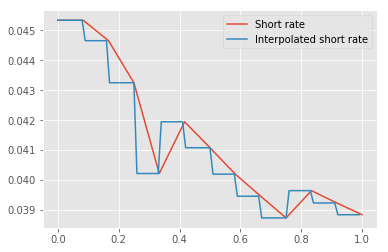

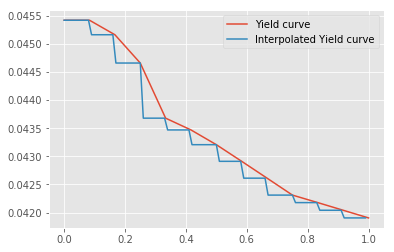

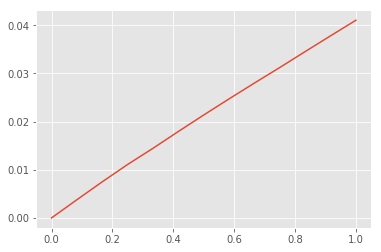

Bootstrap dividend


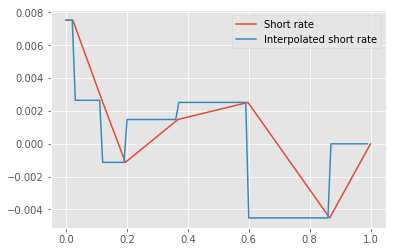

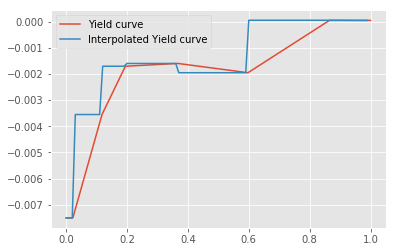

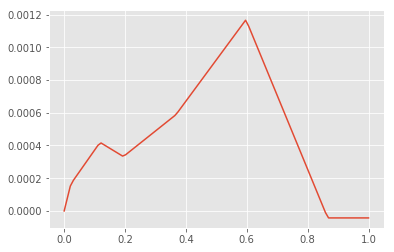

In [ ]:
#Read csv files as dataFrames
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromCSV(workingFolder,
                                                                  "9_8_2001__filterdax")

#### From Dat files

Tikhonov PDE repricing error on training set :  2.4207935408017573
Bootstrap discounting


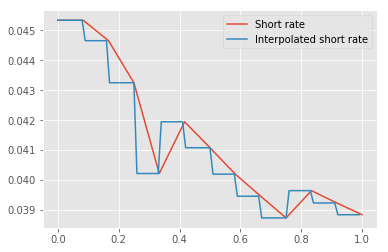

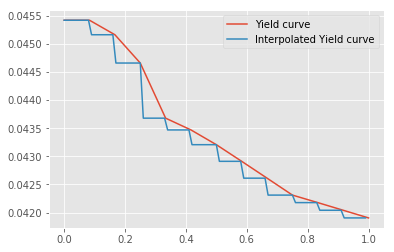

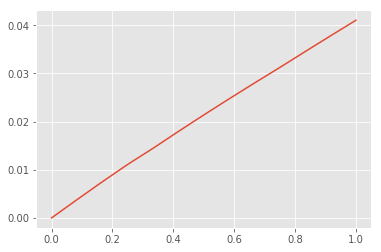

Bootstrap dividend


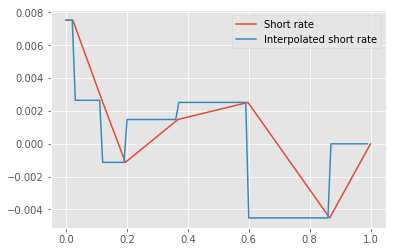

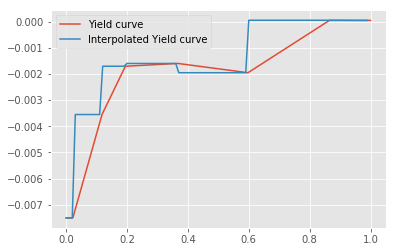

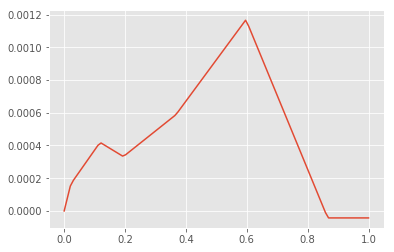

In [ ]:
trainingSet, testingSet, bootstrap, S0 = loadData.loadDataFromDat(workingFolder,
                                                                  "9_8_2001__filterdax")

In [ ]:
importlib.reload(loadData)

<module 'loadData' from './code/loadData.py'>

In [ ]:
pd.options.mode.chained_assignment = 'raise'

#### SPX Data

We assume a piecewise constant discount short rate $r$ and a piecewise constant dividend short rate $q$.

We estimate the "zero coupon dividend" $D(T) = e^{-\int_{0}^{T} q_s ds}$ by regressing it against maturity :
$$e^{-\int_{0}^{T} q_s ds} = \frac{C(T,K) - P(T,K) + K e^{-\int_{0}^{T} r_s ds}}{S_0}$$


Then we have $\hat{q}_t = - \frac{ \log{D(\overline{T})} - \log{D(\underline{T})} }{ \overline{T} - \underline{T} }$ with $\overline{T}$ the smallest discretized maturity greater than $T$ and $\underline{T}$ the grestest discretized maturity inferior than $T$.

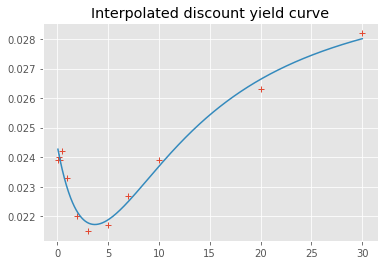

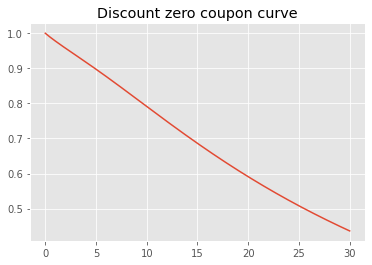

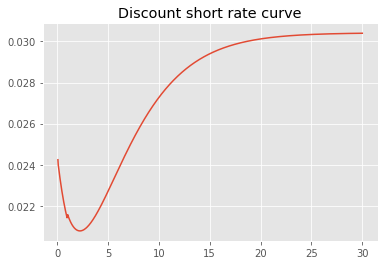

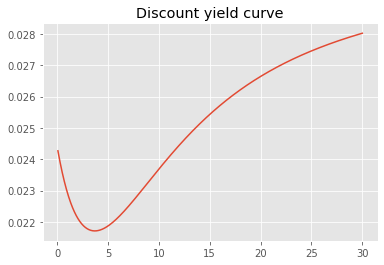

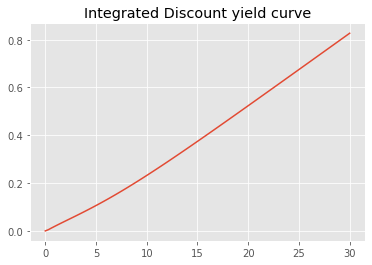

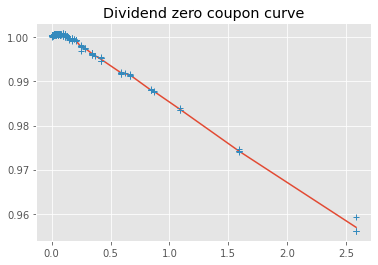

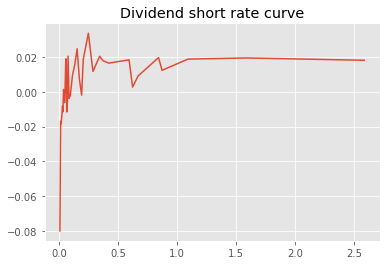

/content/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


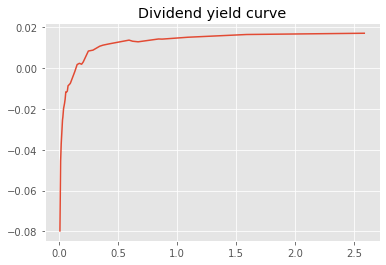

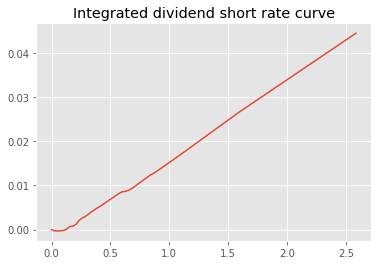

In [ ]:
workingFolder = "./"#"./data/"
fileName = "Option_SPX_18_Mai_2019Feuille2.xlsm"
asOfDate = "2019-05-18"
trainingSet, testingSet, bootstrap, S0 = loadData.loadCBOTData(workingFolder, fileName, asOfDate)

In [ ]:
importlib.reload(loadData)

<module 'loadData' from '/content/loadData.py'>

####  Eurostoxx data

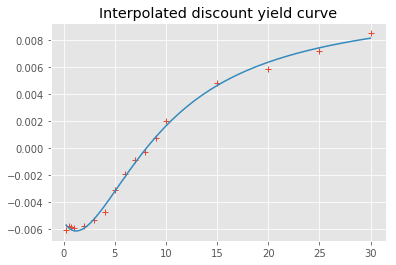

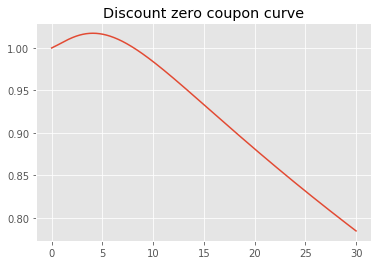

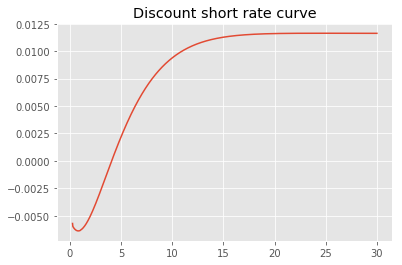

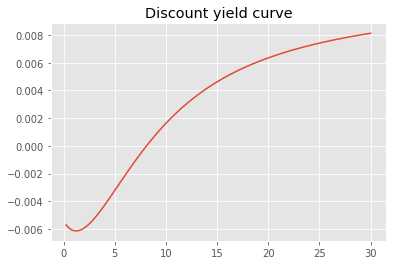

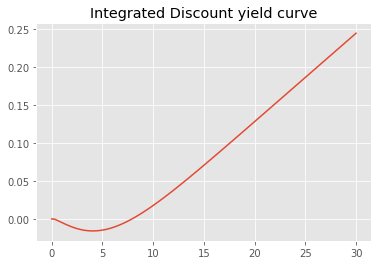

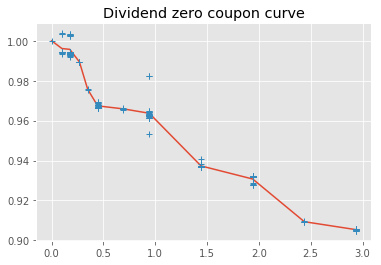

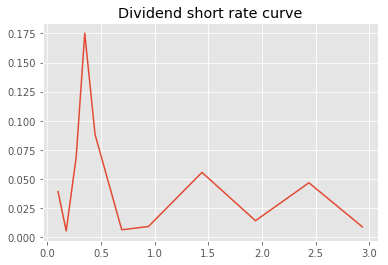

./code/bootstrapping.py:271: RuntimeWarning: invalid value encountered in double_scalars
  return (1 / x - 1) / float(t)


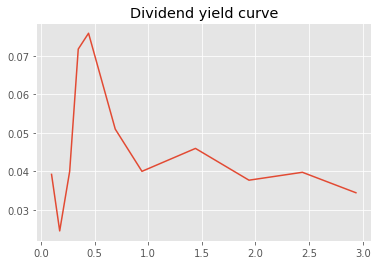

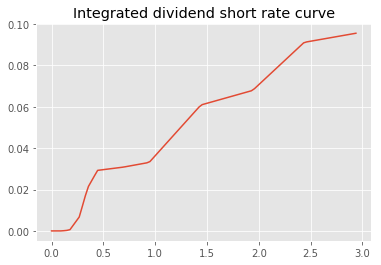

In [ ]:
workingFolder = "./data/"
asOfDate = "2019-01-10"
filename = "Data_EuroStoxx50_20190110_all_for_Marc.xlsx"
trainingSet, testingSet, bootstrap, S0 = loadData.loadESXData(workingFolder, filename, asOfDate)

In [ ]:
bootstrap.discountShortRate(10)

array(0.009402)

#### Load preformatted data

In [6]:
workingFolder = "./"#"./data/"
trainingSet, testingSet, bootstrap, S0 = loadData.loadFormattedData(workingFolder)

# Formatting data

### Boostsrapping Rate Curve


- For bootstrapping short rate $r$ and dividend rate $q$, we assume piecewise constant short rate for risk free rate and dividend i.e. 
$\exp{(-\int_{0}^{T} r_t d_t)} = \exp{(-\sum_{i} r_i h)}$ and $\exp{(\int_{0}^{T} q_t d_t)} = \exp{(\sum_{i} q_i h)}$.
- $\forall i \in \{0,..,N\}$ with $ t_0 = 0$ and $t_N = T$, we have that $\frac{\log{B(0,t_{i+1})} - \log{B(0,t_i)}}{h} = r_i$ with $B(0,T_i)$ the price of a bond expiring at time $t_i$. 
- For dividend, we just to substitute $B(0,T_i)$ with with spot action price plus dividend cash flow received until time $T_i$ i.e. $S_{t_0} + \sum\limits_i Div_{t_i}$.
- Then we linearly interpolate $r$ and $q$.
-  Linear interpolation is also used for integrals $\int_{0}^{T} q_t d_t$ and $\int_{0}^{T} r_t d_t$ in order to obtain discount factor or dividend factor. 

**riskFreeIntegral** corresponds to $I_T = \int_{0}^{T} r_u du$.
**riskFreeSpline**  corresponds to $r_u$ evaluated on a subgrid. Interpolated as step function from zero coupons

**divSpreadIntegral** corresponds to $I_T = \int_{0}^{T} q_u du$, can be negative.
**divSpline**  corresponds to $q_u$ evaluated on a subgrid, can be negative.

Training dataset is built on market prices observed on the dax.
Testing dataset is list of prices drawn from an excel provided by Stephane Crépey.
Prices come from the calibrated local volatility with tikhonov regularisation (see Crépey 2002 paper).
Implied volatitilities in both dataset are obtained from local volatility.

These curve satisfy together the call put parity.

Spot level is contained in underlying.csv

### Pricing black-scholes price

#### Change of variable

- In presence of dividend rate $d$ and risk free rate $r$ Dupire formula is :   $$\sigma^2(T,K) = 2 \frac{ \partial_T P(T,K) + (r-q) K \partial_K P(T,K) + qP(T,K)}{K² \partial_{K}^2 P(T,K)}$$ 
with Strike $K$, Maturity $T$, dividend rate $q$ and risk-free rate $r$, $P$ our pricing function. 
- We apply the following change of variable : $$ w(T,k) = \exp{(\int_{0}^{T} q_t dt)} P(T,K)$$ with $K = k \exp{(\int_{0}^{T} (r_t - q_t) dt)} $.

- Then Dupire equation becomes :  $\sigma^2(T,K) = 2 \frac{ \partial_T w(T,k)}{k² \partial_{k}^2 w(T,k)}$. 
- If we learn the mapping $v$ with a neural network then we should obtain quickly by adjoint differentiation $\partial_T w$ and $\partial_{k²}^2 w$ and therefore $\sigma$.


In [ ]:
dataSetConstruction.checkCallPutParity(pd.concat([trainingSet, testingSet]), 
                                       S0, 
                                       bootstrap)

In [7]:
dataSet = trainingSet #Training set
dataSetTest = testingSet #Testing set
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


In [8]:
dataSetTest.head()

Price     Delta  ...  logMoneyness  impliedTotalVariance
Strike Maturity                   ...                                    
1700.0 0.246      0.80 -0.004171  ...     -0.521416              0.042306
2300.0 0.419     14.30 -0.069169  ...     -0.220227              0.024620
2350.0 0.093      1.20 -0.013019  ...     -0.196766              0.008143
       0.112      1.85 -0.018041  ...     -0.197041              0.009257
2400.0 0.419     20.55 -0.099289  ...     -0.177667              0.021477

[5 rows x 15 columns]

In [9]:
dfCurve = dataSetConstruction.savingData(bootstrap, 
                                         dataSet, 
                                         dataSetTest, 
                                         workingFolder)

Saving bootstrapping under dfCurve.csv
Saving training set under trainingDataSet.csv
Saving bootstrapping under testingDataSet.csv


In [10]:
dataSet.shape

(135, 15)

In [11]:
dataSetTest.shape

(144, 15)

In [12]:
S0

2859.53

In [13]:
def getCall(df):
    return df[df["OptionType"]==1]
def getPut(df):
    return df[df["OptionType"]==-1]

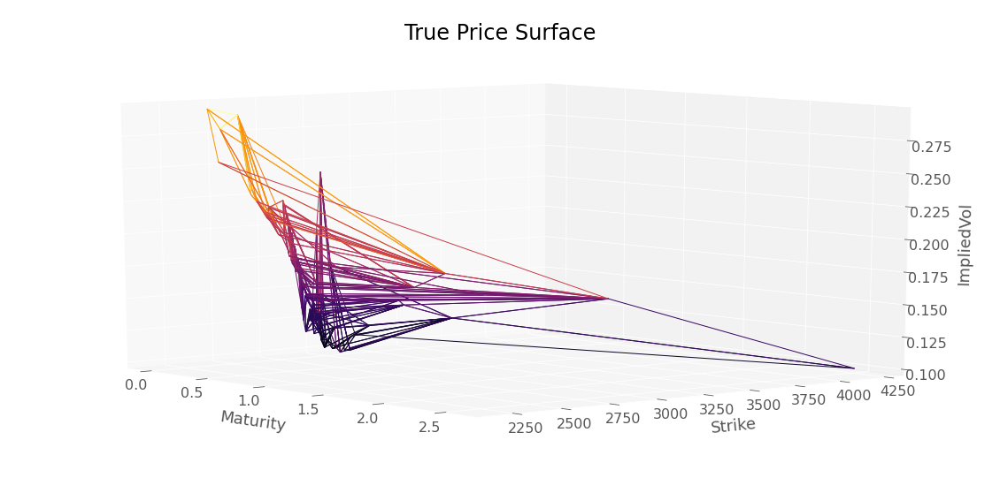

In [14]:
plotTools.plotSerie(getPut(trainingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

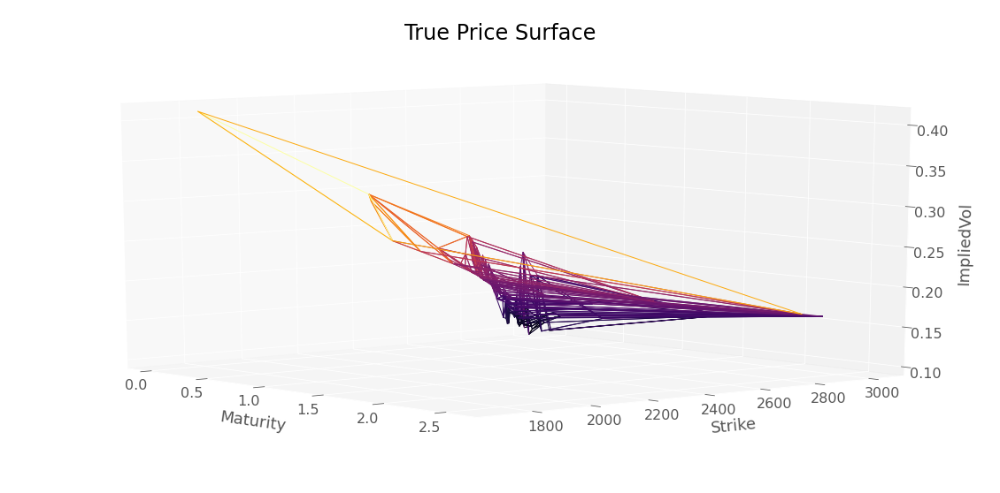

In [15]:
plotTools.plotSerie(getPut(testingSet)["ImpliedVol"], 
                    yMin=0,
                    yMax=3*S0, 
                    Title = 'True Price Surface')

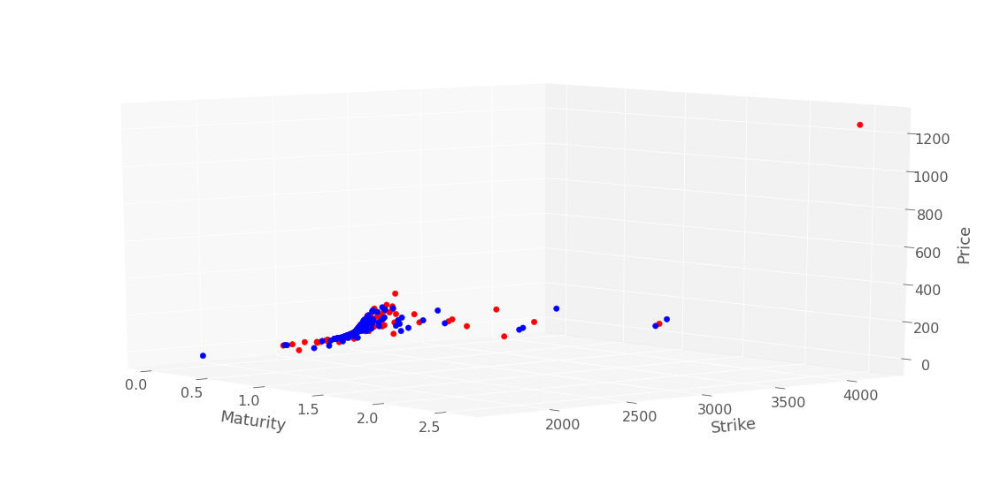

In [16]:
plotTools.plot2Series(getPut(testingSet)["Price"], 
                      getPut(trainingSet)["Price"], 
                      yMin=0,
                      yMax=3*S0, 
                      Title = 'True Price Surface')

In [17]:
testingSet.shape

(144, 15)

In [18]:
trainingSet.shape

(135, 15)

In [19]:
dataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance
Strike,Maturity,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013


## Scaling methods

Use min-max of scaling strike between 0 et 1 for improving stability of neural network training. 

In [20]:
dataSet["locvol"] = np.ones_like(dataSet["ImpliedVol"]) 
dataSetTest["locvol"] = np.ones_like(dataSetTest["ImpliedVol"]) 

In [21]:
scaler = skl.preprocessing.MinMaxScaler(feature_range=(0, 1))
scaler.fit(dataSet)
scaledDataSet = neuralNetwork.transformCustom(dataSet, scaler)
scaledDataSetTest = neuralNetwork.transformCustom(dataSetTest, scaler)

In [22]:
scaledDataSet.head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance,locvol
Strike,Maturity,,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020,1.0
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800,1.0
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281,1.0
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907,1.0
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013,1.0


In [23]:
#Search strike for ATM option
midS0 = dataSet[dataSet.index.get_level_values("Strike") >= S0].index.get_level_values("Strike").min()

## Plot functions

In [24]:
KMin = 0#0.7 * S0[0]
KMax = 2.0 * S0#1.3 * S0[0]


In [85]:
dataSet.shape

(135, 16)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


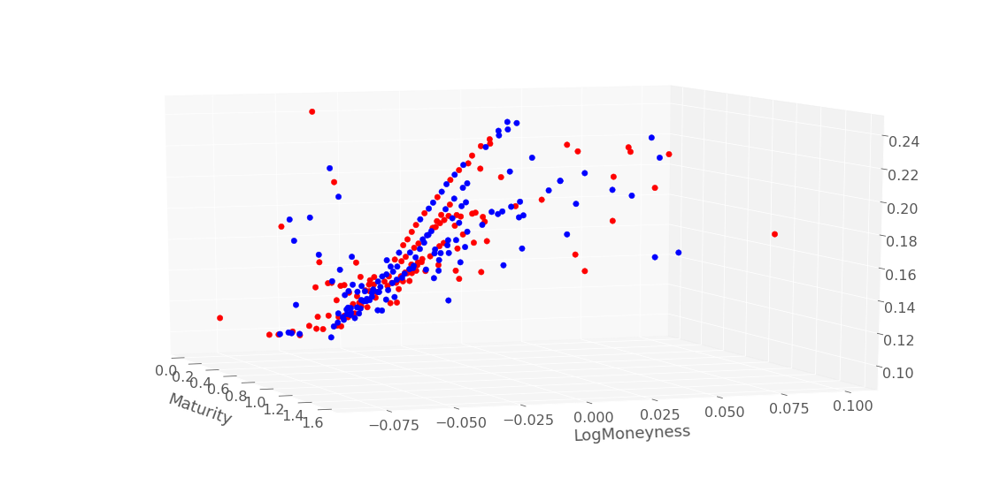

In [96]:
filter = dataSet["Maturity"] <= 2.0
filterTest = dataSetTest["Maturity"] <= 2.0
logMin = np.log(KMin/S0), 
logMax = 0.1 #np.log(KMax/S0), 
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[filterTest]["ImpliedVol"], S0), 
                      plotTools.convertToLogMoneyness(dataSet[filter]["ImpliedVol"], S0), 
                      yMin=logMin,
                      yMax=logMax,
                      az = 340,
                      Title = 'True Implied Vol Surface')

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:3: RuntimeWarning: divide by zero encountered in log
  This is separate from the ipykernel package so we can avoid doing imports until


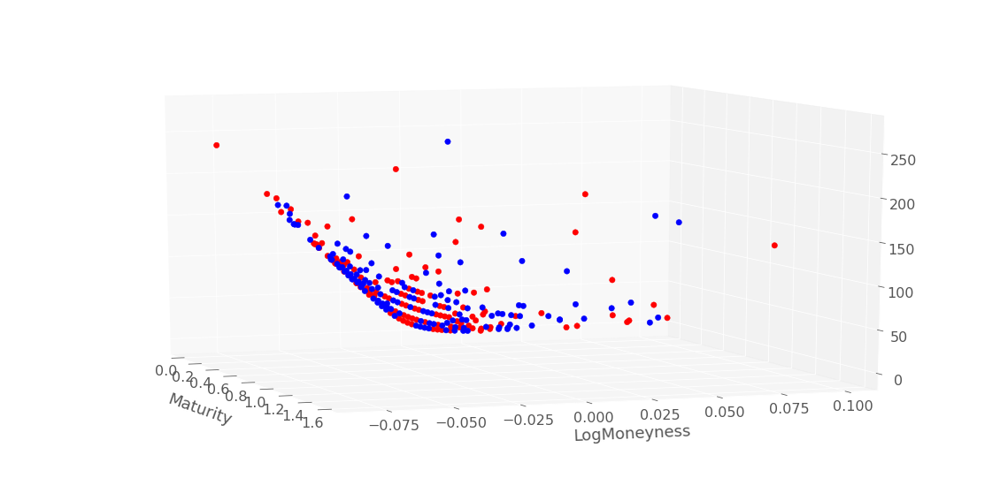

In [97]:
filter = dataSet["Maturity"] <= 2.0
filterTest = dataSetTest["Maturity"] <= 2.0
logMin = np.log(KMin/S0), 
logMax = 0.1 #np.log(KMax/S0), 
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[filterTest]["Price"], S0), 
                      plotTools.convertToLogMoneyness(dataSet[filter]["Price"], S0), 
                      yMin=logMin,
                      yMax=logMax,
                      az = 340,
                      Title = 'True Price Surface')

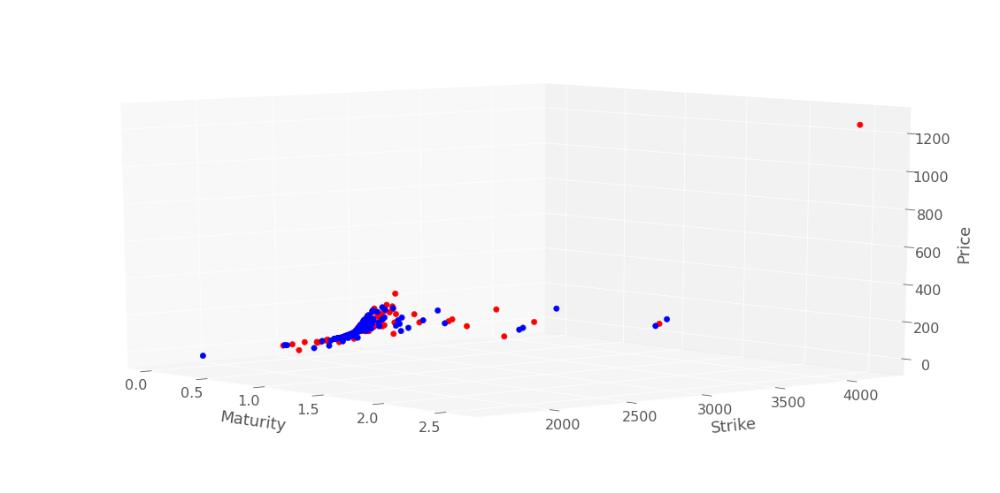

In [82]:
plotTools.plot2Series(dataSetTest["Price"], 
                      dataSet["Price"], 
                      yMin=KMin,
                      yMax=KMax, 
                      Title = 'True Price Surface')

In [26]:
importlib.reload(plotTools)

<module 'plotTools' from '/content/plotTools.py'>

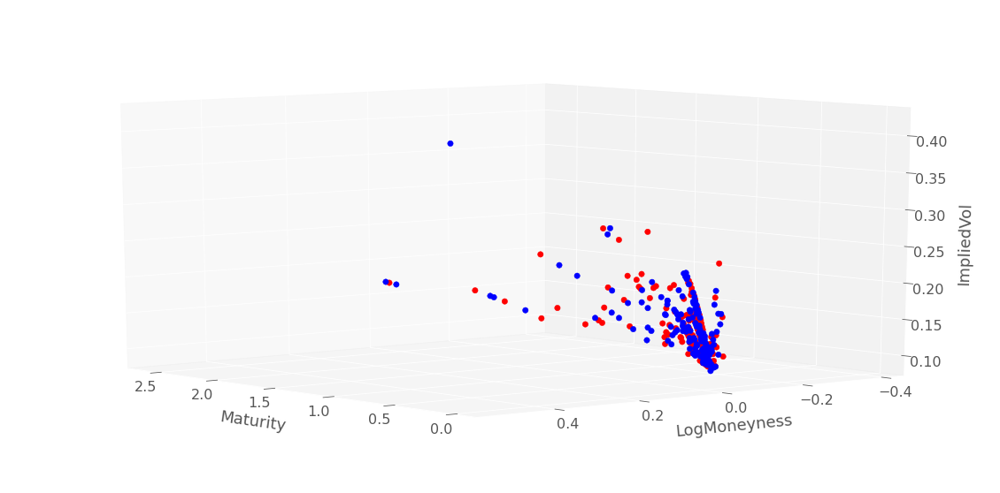

In [27]:
plotTools.plot2Series(plotTools.convertToLogMoneyness(dataSetTest[dataSetTest.Maturity > 0], S0)["ImpliedVol"], 
                      plotTools.convertToLogMoneyness(dataSet[dataSet.Maturity > 0], S0)["ImpliedVol"], 
                      yMin=-1000,
                      yMax=1000, 
                      Title = 'True Implied vol Surfaces', 
                      az=140)

In [28]:
plt.get_cmap("plasma")(0)

(0.050383, 0.029803, 0.527975, 1.0)

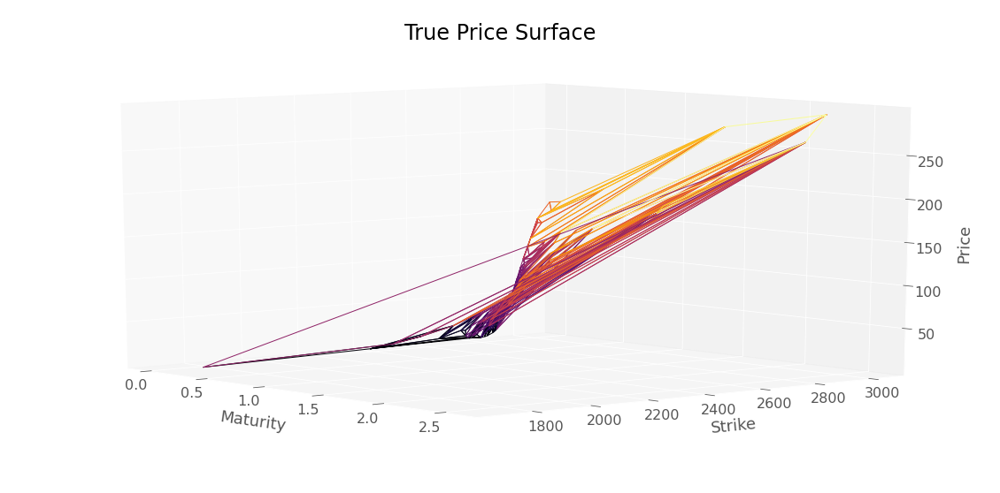

In [29]:
plotTools.plotSerie(dataSetTest[dataSetTest.Maturity > 0]["Price"], 
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

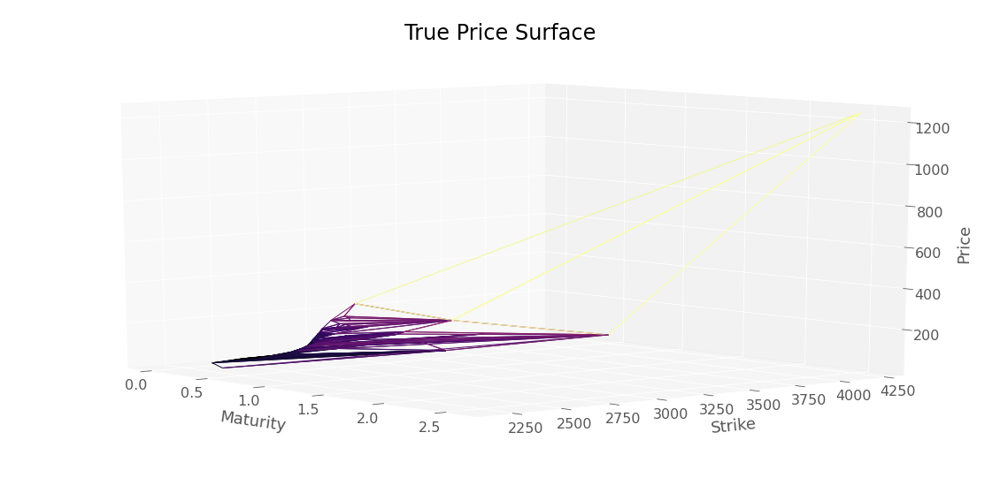

In [30]:
plotTools.plotSerie(dataSet["Price"],
                    yMin=KMin,
                    yMax=KMax, 
                    Title = 'True Price Surface')

In [31]:
neuralNetwork.inverseTransform(scaledDataSet, scaler).head()

,,Price,Delta,Vega,Delta Strike,Gamma Strike,Theta,ChangedStrike,DividendFactor,Strike,Maturity,ImpliedVol,VegaRef,OptionType,logMoneyness,impliedTotalVariance,locvol
Strike,Maturity,,,,,,,,,,,,,,,,
2200.0,0.419,9.95,-0.047968,184.678147,0.094049,-9.963916e-07,103.538454,2194.553900,0.994628,2200.0,0.419,0.2586,169.246997,-1.0,-0.264678,0.028020,1.0
2325.0,0.112,1.65,-0.015858,38.013410,0.027412,-3.969604e-05,73.268907,2323.142879,1.000111,2325.0,0.112,0.2958,15.762704,-1.0,-0.207736,0.009800,1.0
2400.0,0.093,1.60,-0.017779,38.199664,0.029753,-4.470370e-05,88.192154,2398.742294,1.000292,2400.0,0.093,0.2798,22.362901,-1.0,-0.175713,0.007281,1.0
2510.0,0.170,9.15,-0.074660,166.318158,0.128221,5.540400e-05,230.171845,2506.841932,0.999189,2510.0,0.170,0.2289,194.599716,-1.0,-0.131634,0.008907,1.0
2525.0,0.036,0.55,-0.010731,15.378146,0.016613,-5.456899e-05,87.679835,2524.212274,1.000312,2525.0,0.036,0.2893,6.408137,-1.0,-0.124728,0.003013,1.0


### Implied volatility function calibration by bissection

In [ ]:
%matplotlib inline

# Learning Implied volatility

Best loss (hidden nodes: 50, iterations: 1): 3.87
Best Penalization :  [21.020807, [21.603836, 3.308089e-05, 5.43353]]
Training Time :  1.4408495426177979

In [ ]:
hyperparameters = {}
#penalization coefficient
hyperparameters["lambdaLocVol"] = 0.11#1#0.001#0.01 #100
hyperparameters["lambdaSoft"] = 1#100#0.0001#10#10 #100 
hyperparameters["lambdaGamma"] = 10#10000#100#10 #10000

#Derivative soft constraints parameters
hyperparameters["lowerBoundTheta"] = 0.01
hyperparameters["lowerBoundGamma"] = 0.00001

#Local variance parameters
hyperparameters["DupireVarCap"] = 10
hyperparameters["DupireVolLowerBound"] = 0.05
hyperparameters["DupireVolUpperBound"] = 0.40

#Learning scheduler coefficient
hyperparameters["LearningRateStart"] = 0.1
hyperparameters["Patience"] = 100
hyperparameters["batchSize"] = 50
hyperparameters["FinalLearningRate"] = 1e-6
hyperparameters["FixedLearningRate"] = False

#Training parameters
hyperparameters["nbUnits"] = 100 #number of units for hidden layers
hyperparameters["maxEpoch"] = 10000#10000 #maximum number of epochs

In [ ]:
importlib.reload(neuralNetwork)

<module 'neuralNetwork' from '/content/neuralNetwork.py'>

In [ ]:
#[0.008489941, [1.9128314e-05, 1.4595382e-07, 0.0053249267]]

In [ ]:
res = neuralNetwork.create_train_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                                scaledDataSet,
                                                True,
                                                hyperparameters,
                                                scaler,
                                                modelName = "convexSoftGatheralVolModel")
y_pred4G, volLocale4G, dNN_T4G, gNN_K4G, lossSerie4G = res

Iteration :  591 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 100, iterations: 592): -3.81
Best Penalization :  [0.021256074, [0.0, 0.0, 0.0]]
Best Penalization (Refined Grid) :  [[0.00083694153, 0.0, 1.478841e-05]]
Iteration :  1008 new learning rate :  0.0010000000000000002
Best loss (hidden nodes: 100, iterations: 1009): -4.58
Best Penalization :  [0.009499378, [3.5111465e-05, 0.0, 9.3393806e-05]]
Best Penalization (Refined Grid) :  [[0.00050598226, 0.0, 0.00020802692]]
Iteration :  1291 new learning rate :  0.00010000000000000003
Best loss (hidden nodes: 100, iterations: 1292): -4.59
Best Penalization :  [0.009407136, [3.5801942e-05, 0.0, 9.734781e-05]]
Best Penalization (Refined Grid) :  [[0.0004929016, 0.0, 0.00021124477]]
Best loss (hidden nodes: 100, iterations: 10000): -4.65
Best Penalization :  [0.009069096, [3.596822e-05, 0.0, 9.317679e-05]]
Best Penalization (Refined Grid) :  [[0.00037816848, 0.0, 0.00010800804]]
Training Time :  1408.632269859314
[<tf

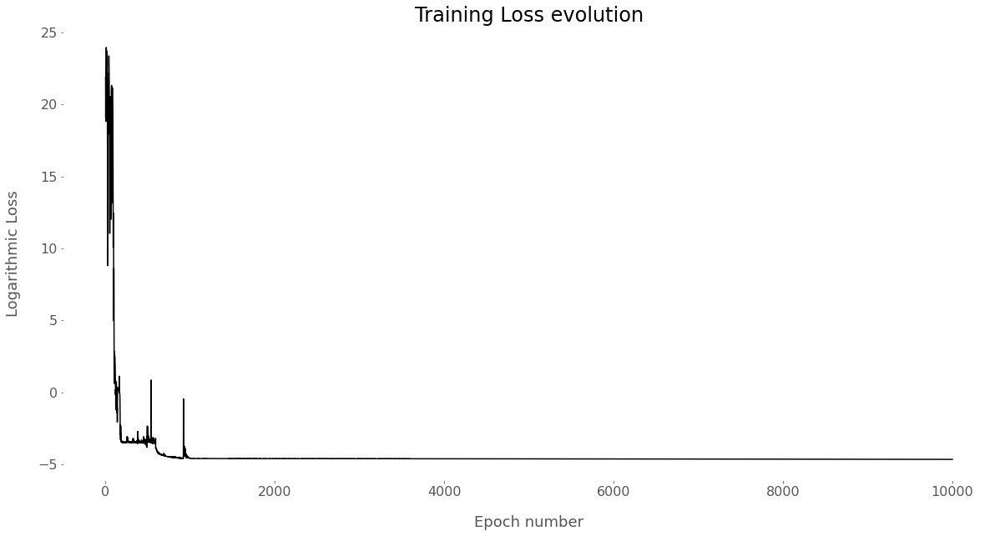

-4.650644779205322

In [ ]:
plotTools.plotEpochLoss(lossSerie4G)
lossSerie4G.iloc[-1]

Best loss (hidden nodes: 100, iterations: 0): -4.65
Best Penalization :  [0.009069096, [3.596822e-05, 0.0, 9.317679e-05]]
Best Penalization (Refined Grid):  [[0.00037816848, 0.0, 0.00010800804]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


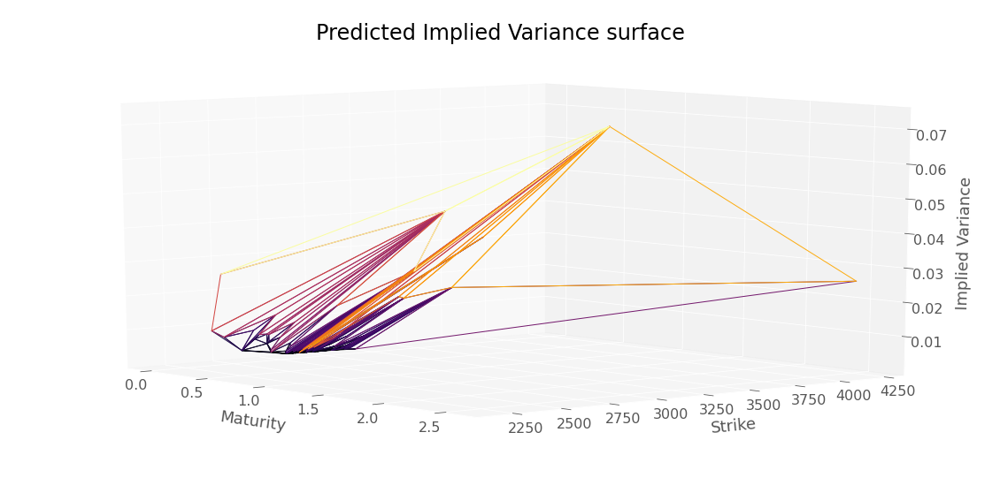

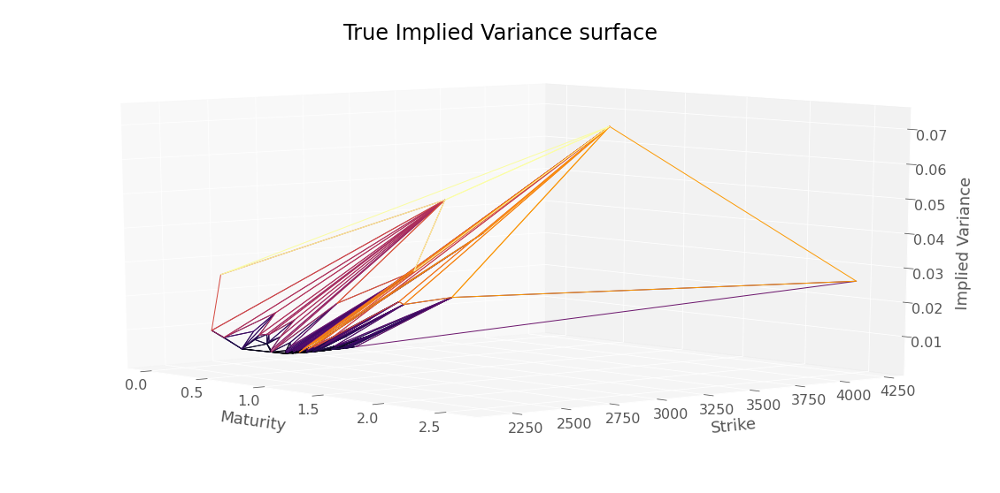

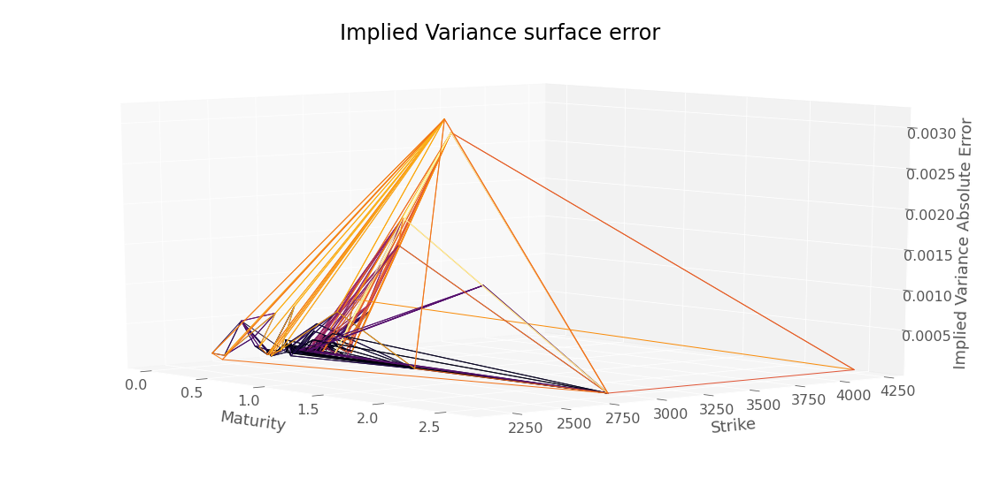

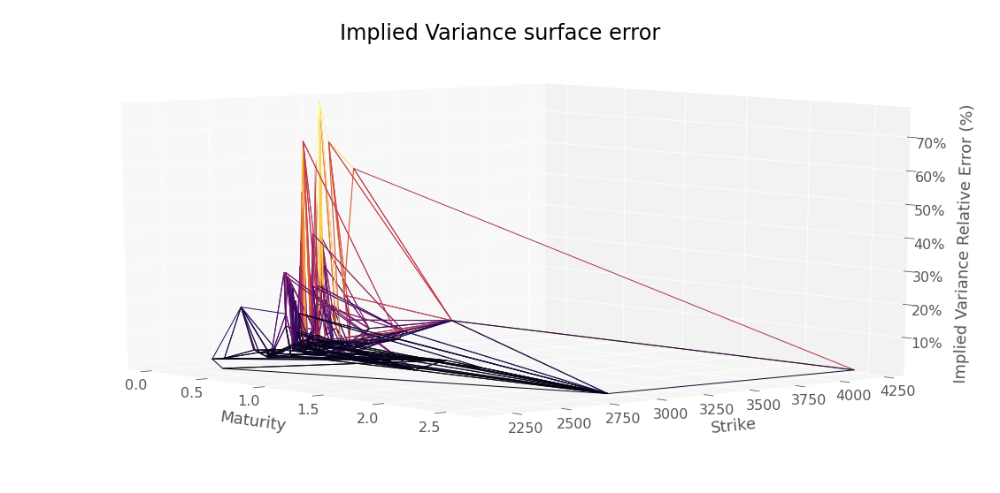

RMSE :  0.0004714797093121025


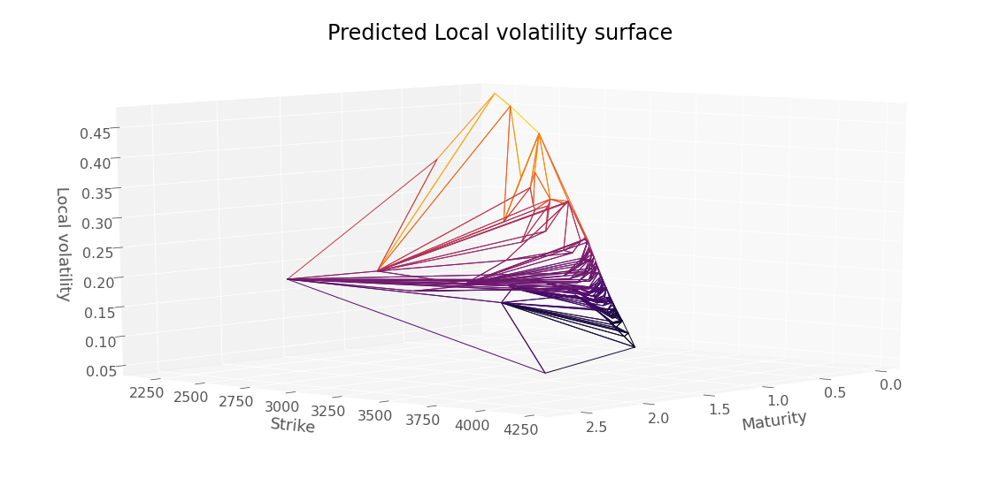

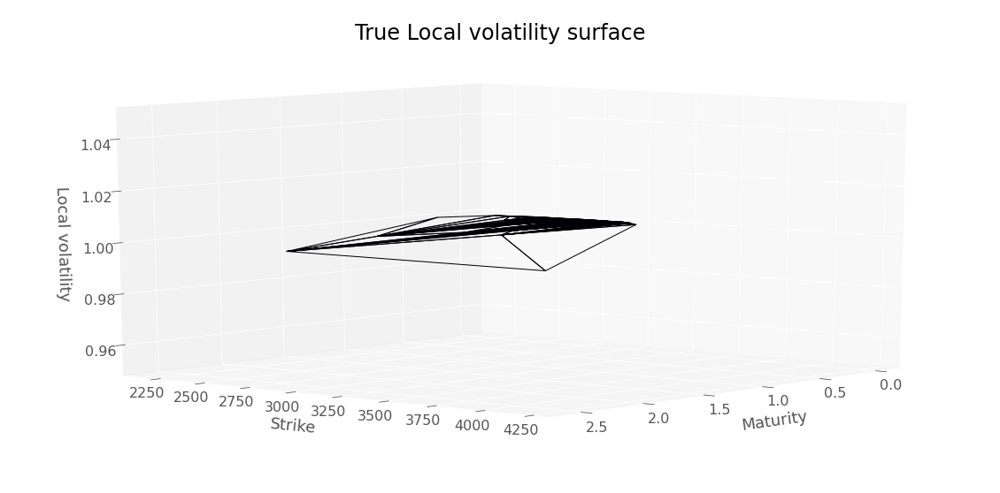

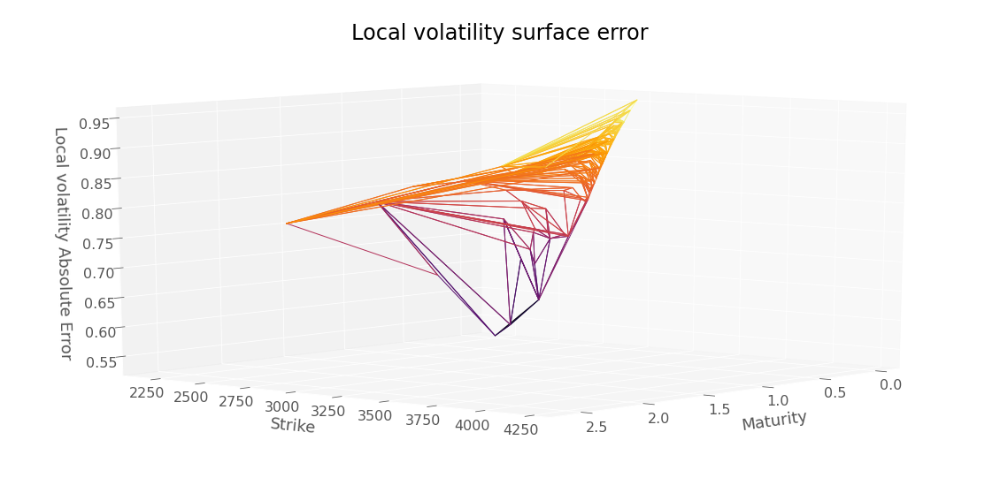

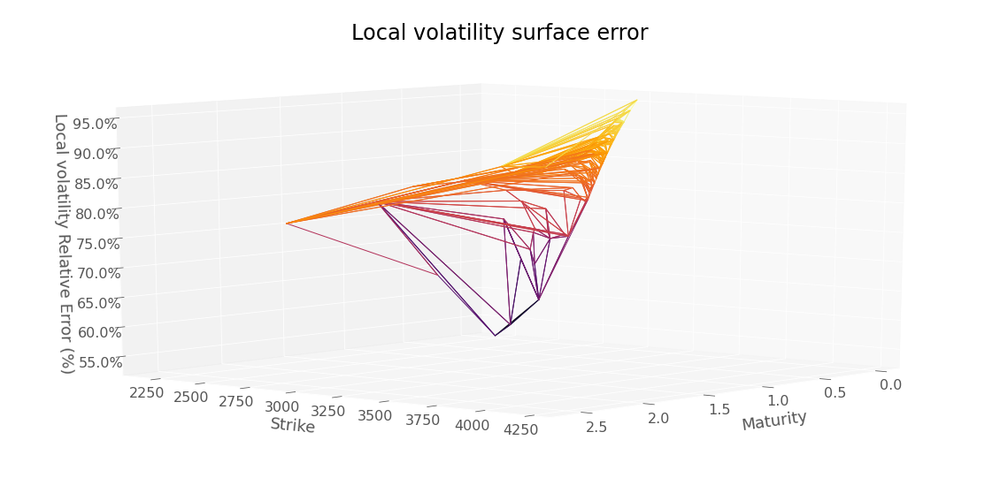

RMSE :  0.8425956087418939


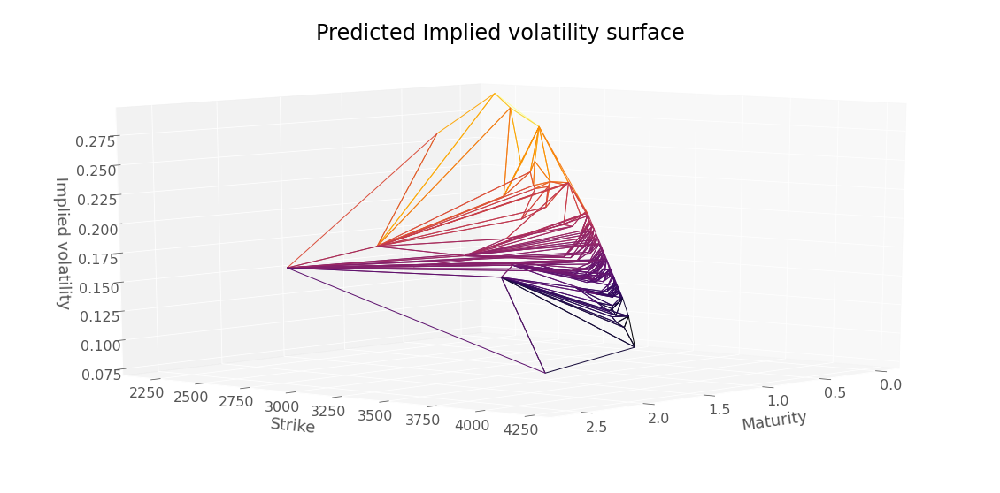

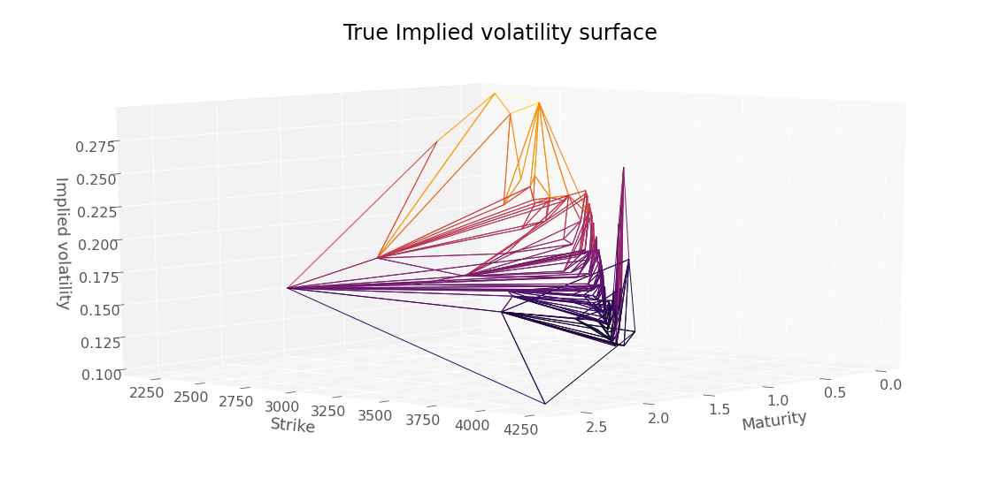

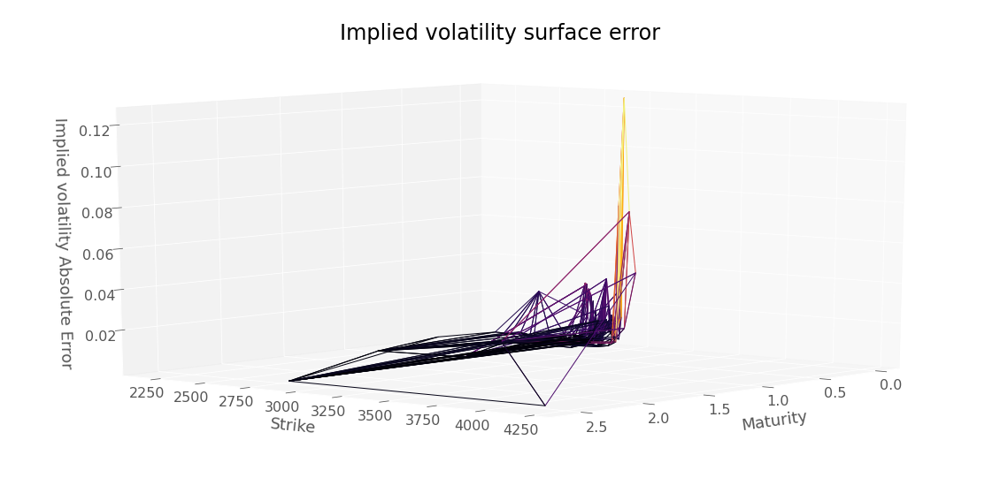

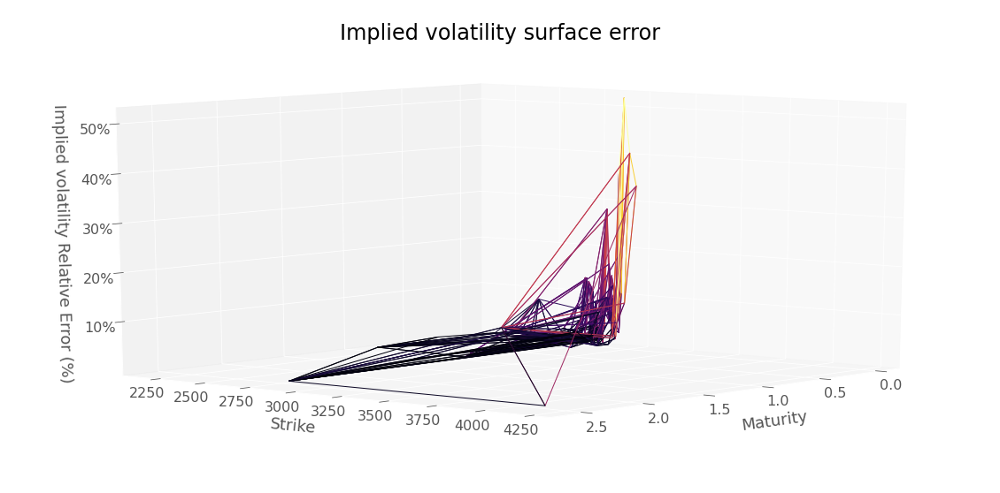

RMSE :  0.01753438194614151


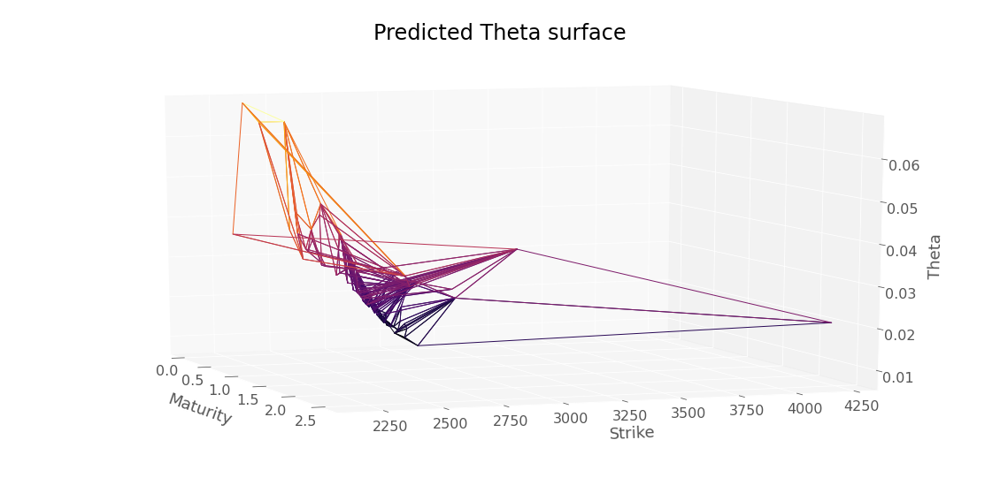

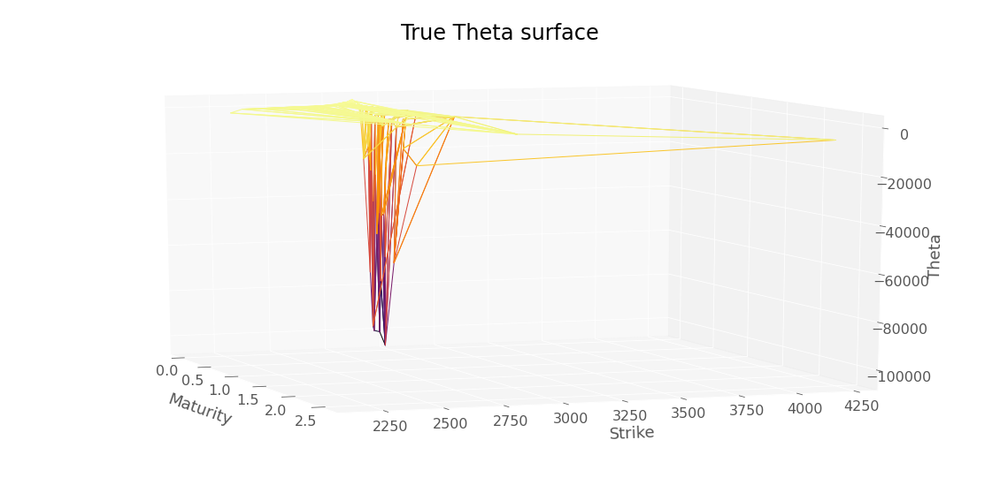

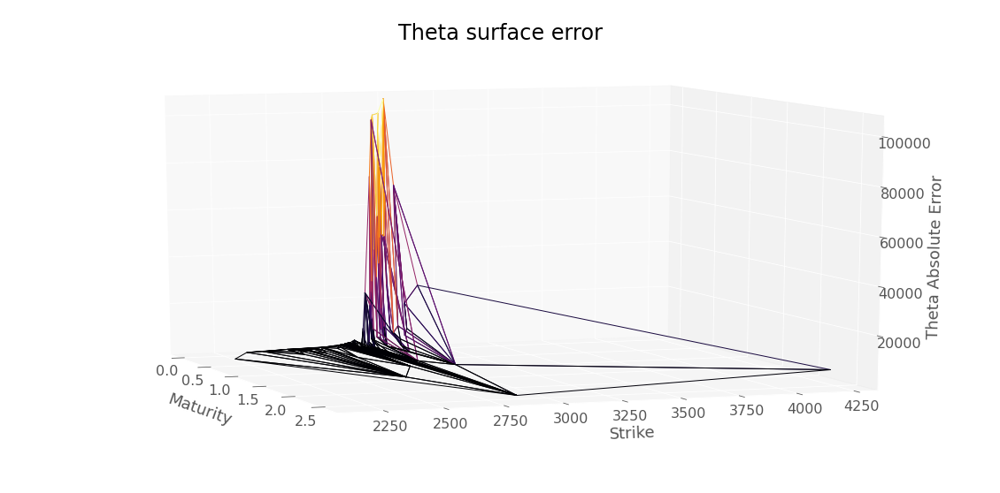

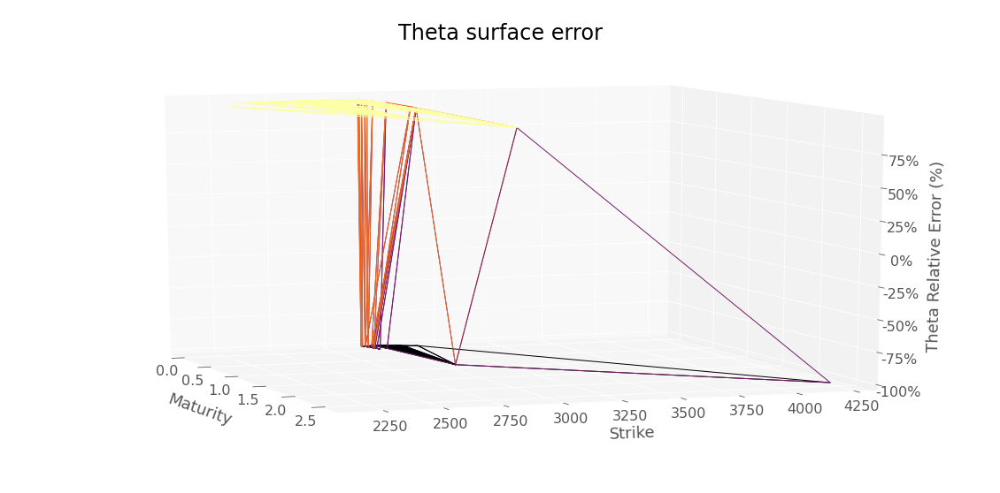

RMSE :  24400.932488547413


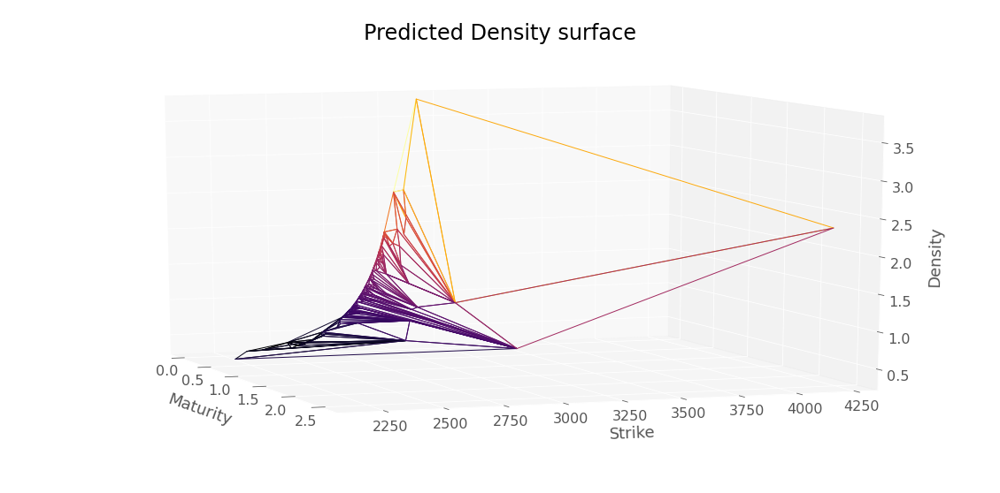

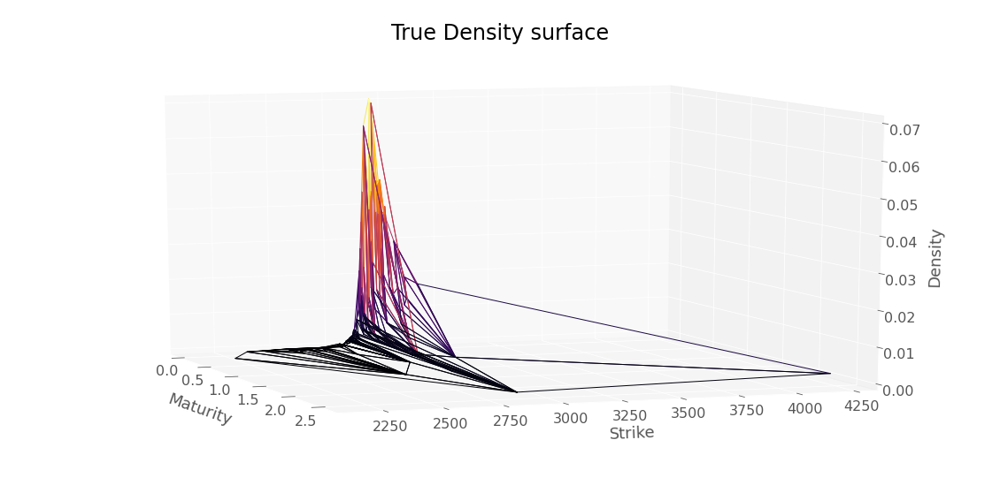

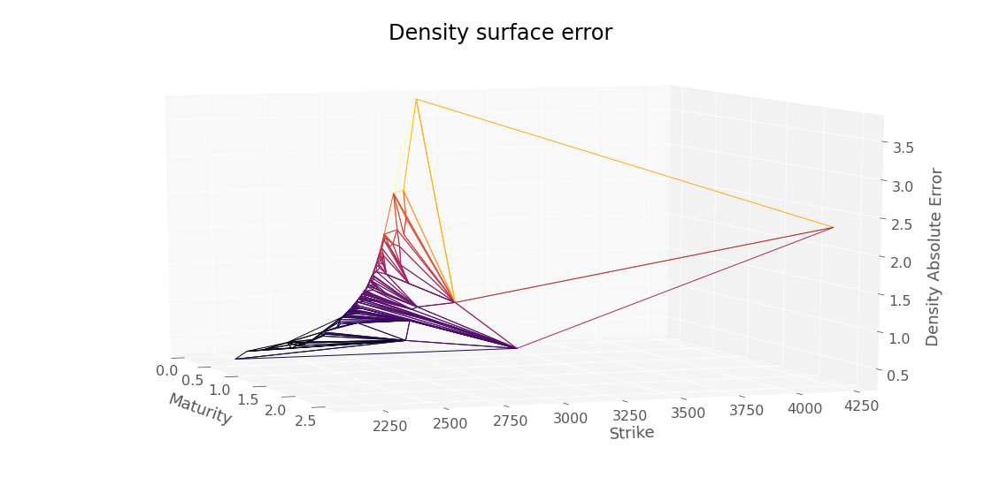

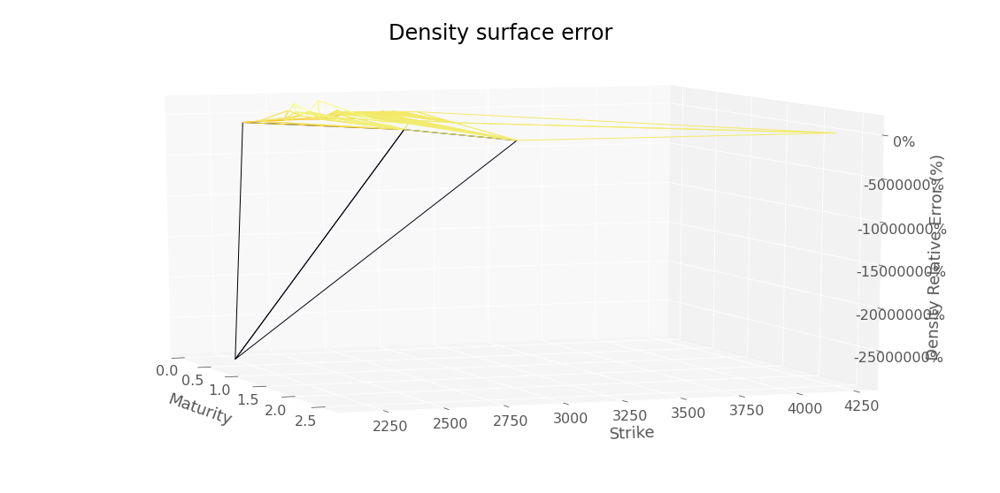

RMSE :  1.1922115020333395


In [ ]:
res = neuralNetwork.create_eval_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               scaledDataSet,
                                               True,
                                               hyperparameters,
                                               scaler,
                                               modelName = "convexSoftGatheralVolModel")
y_pred4G, volLocale4G, dNN_T4G, gNN_K4G, lossSerie4G = res

plotTools.modelSummaryGatheral(y_pred4G, 
                               volLocale4G, 
                               dNN_T4G, 
                               gNN_K4G, 
                               dataSet,
                               yMin = KMin,
                               yMax = KMax)
neuralNetwork.saveDataModel(y_pred4G, 
                            volLocale4G, 
                            dNN_T4G, 
                            "convexSoftGatheralVolModelTrain")

In [ ]:
volLocale4G.loc[(midS0,slice(None))]

Strike  Maturity
2860.0  0.005       0.157293
        0.011       0.154747
        0.036       0.145647
        0.074       0.136741
        0.112       0.134297
        0.285       0.149408
Name: Dupire, dtype: float32

Best loss (hidden nodes: 100, iterations: 0): -4.48
Best Penalization :  [0.010817869, [6.7813608e-06, 0.0, 8.969092e-05]]
Best Penalization (Refined Grid):  [[0.00037816848, 0.0, 0.00010800804]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


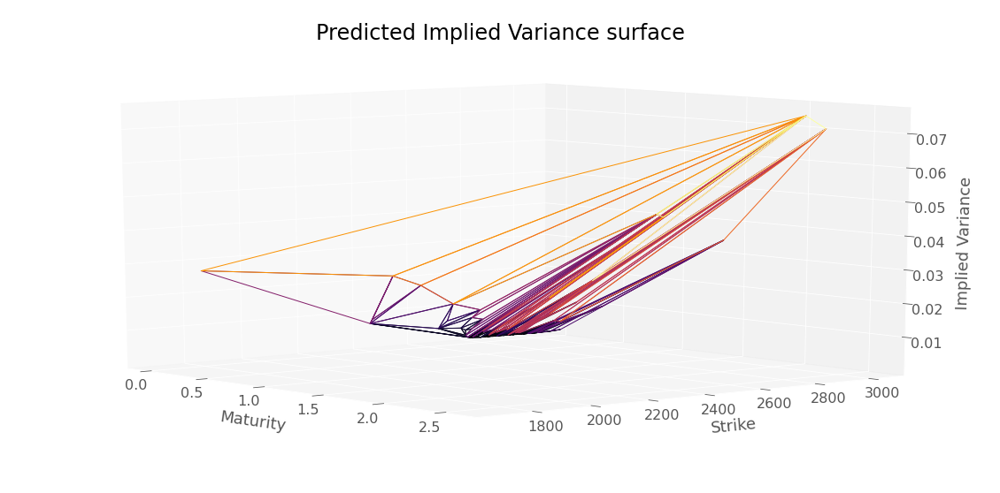

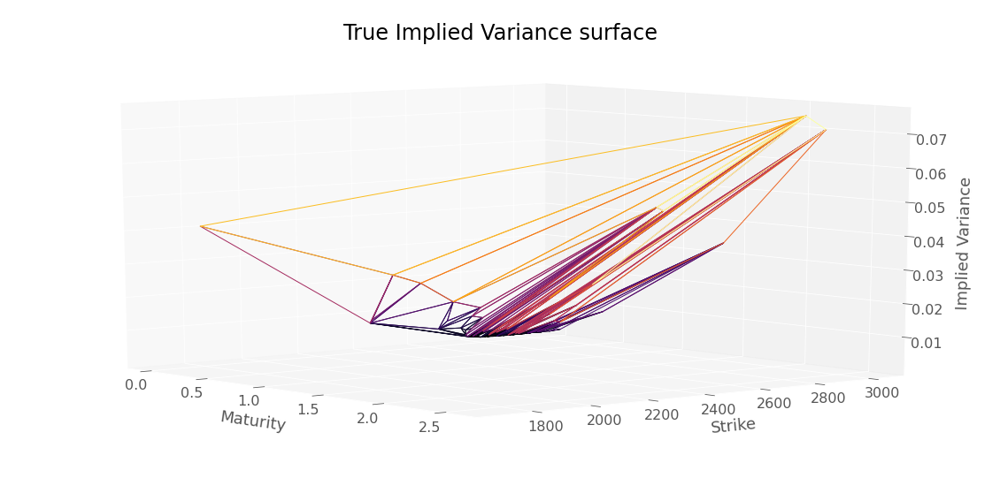

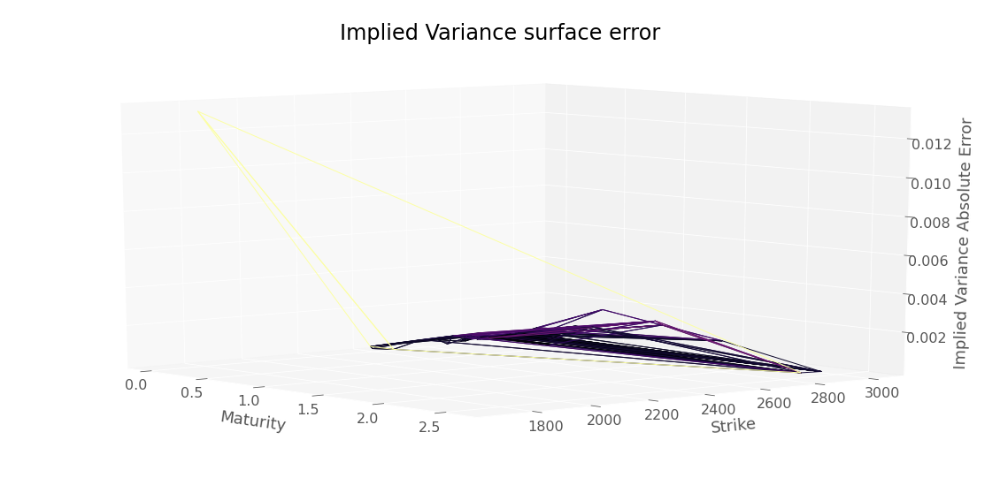

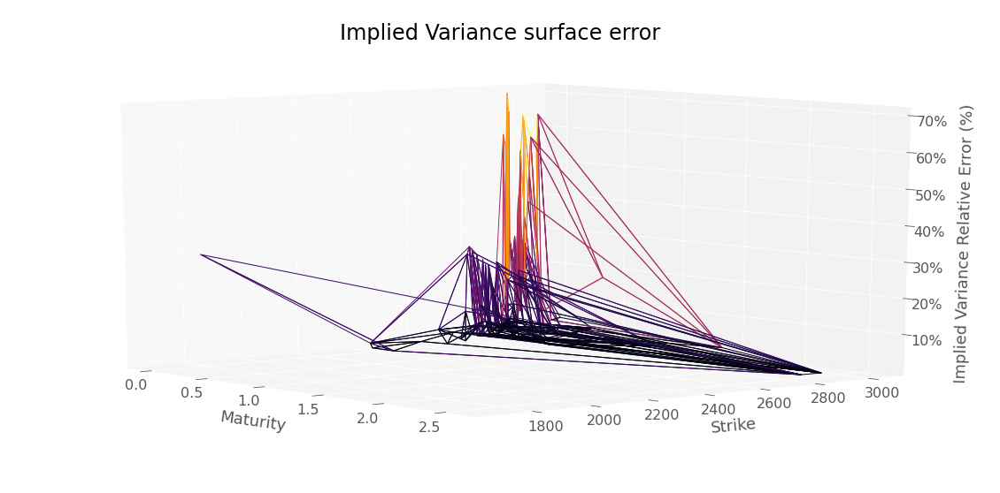

RMSE :  0.001140535361472209


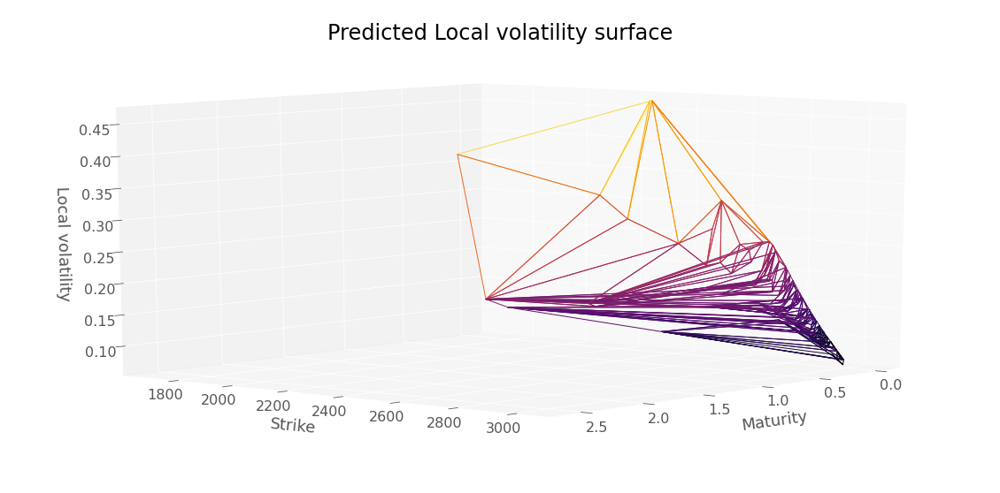

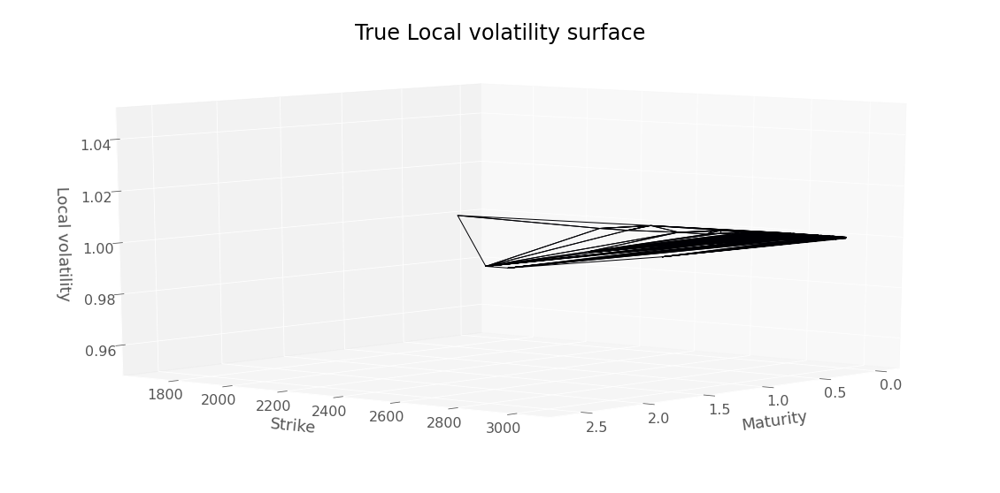

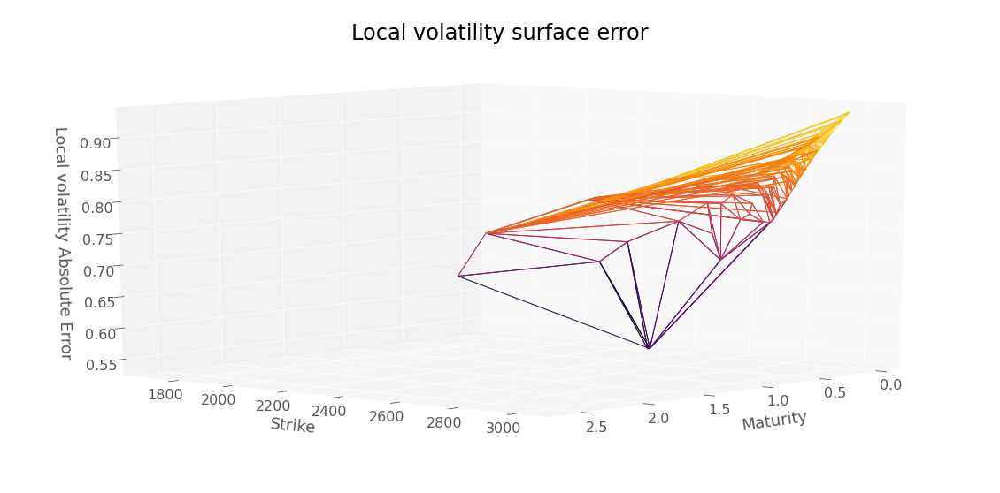

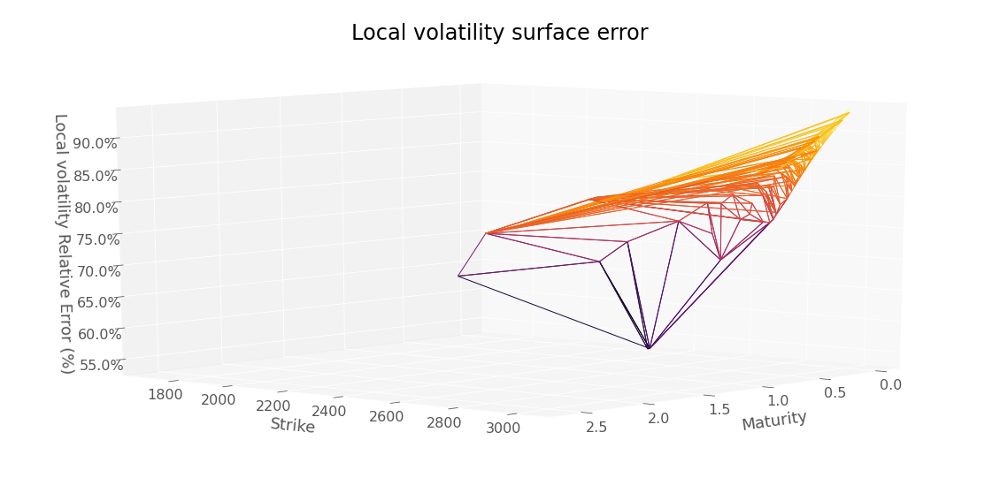

RMSE :  0.8413473682905596


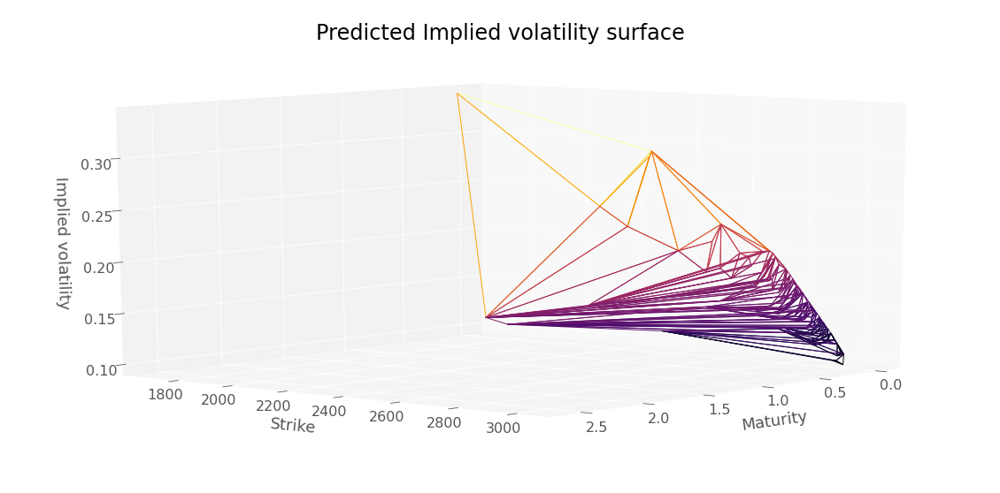

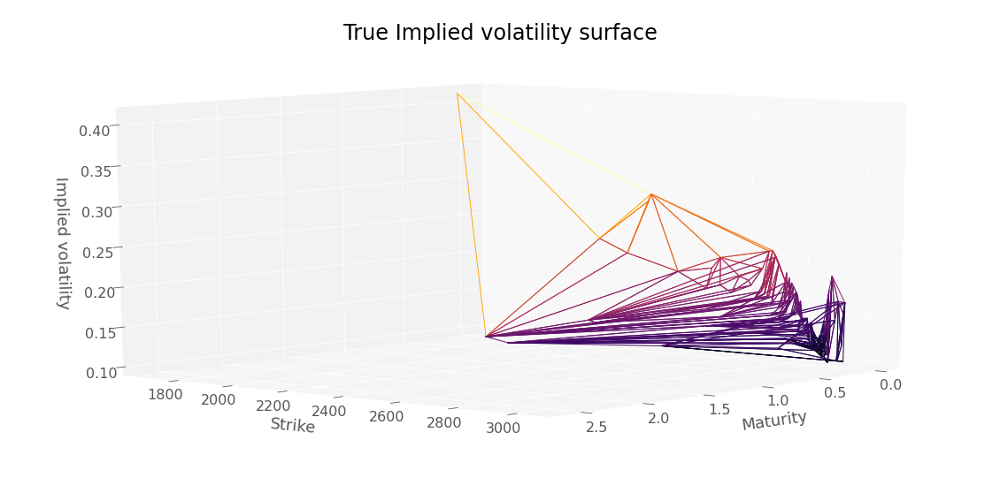

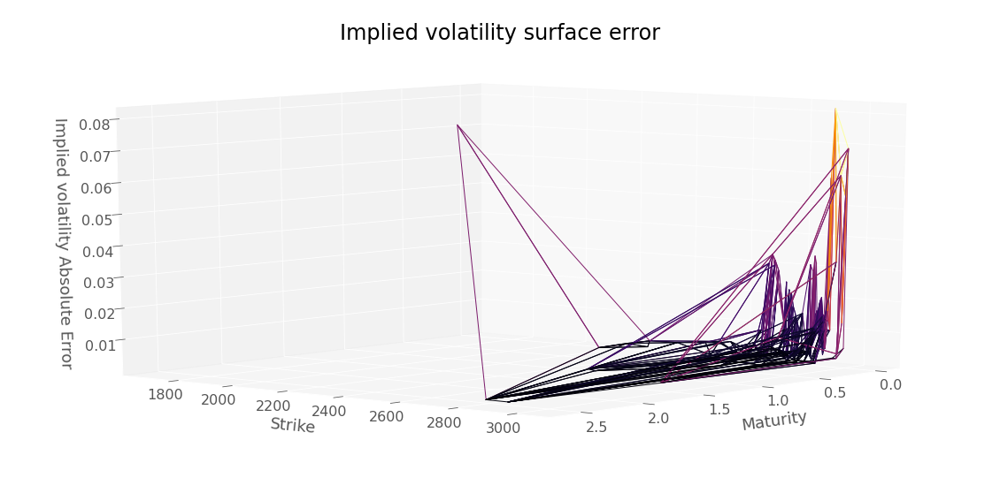

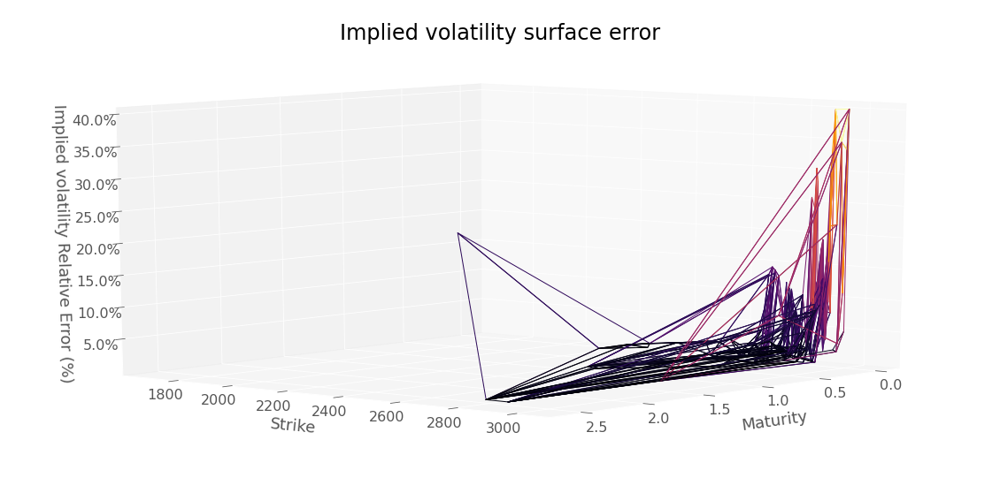

RMSE :  0.01643357794023872


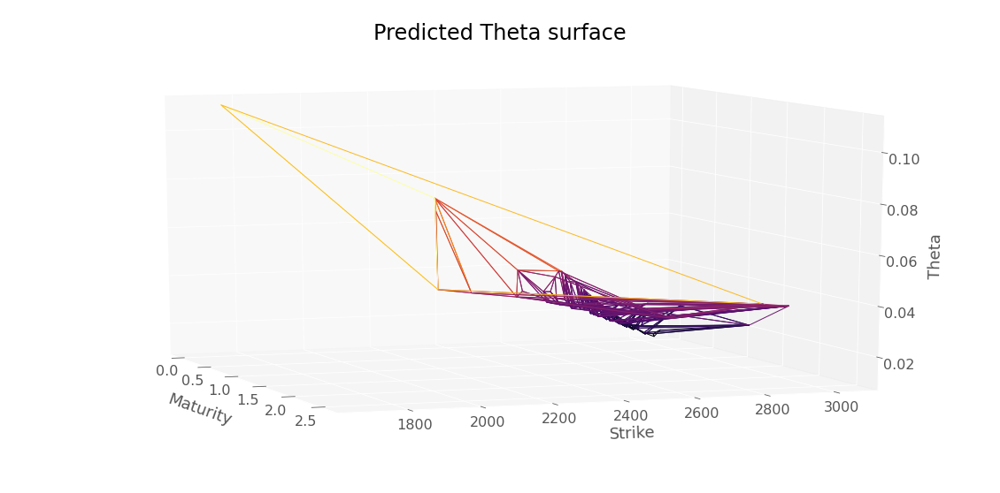

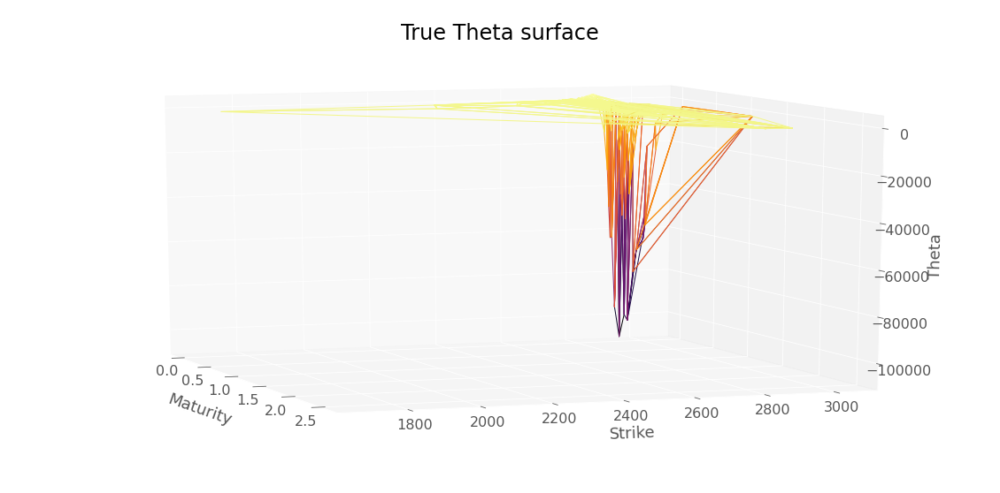

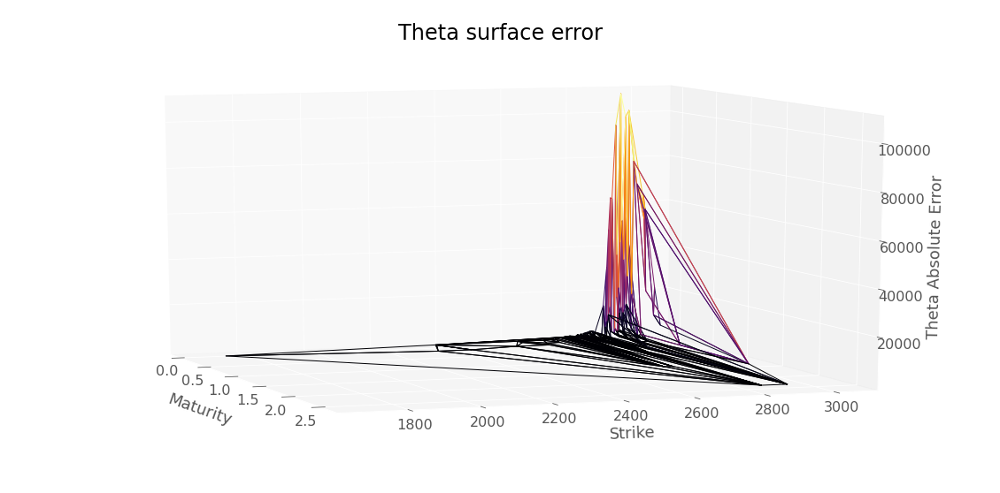

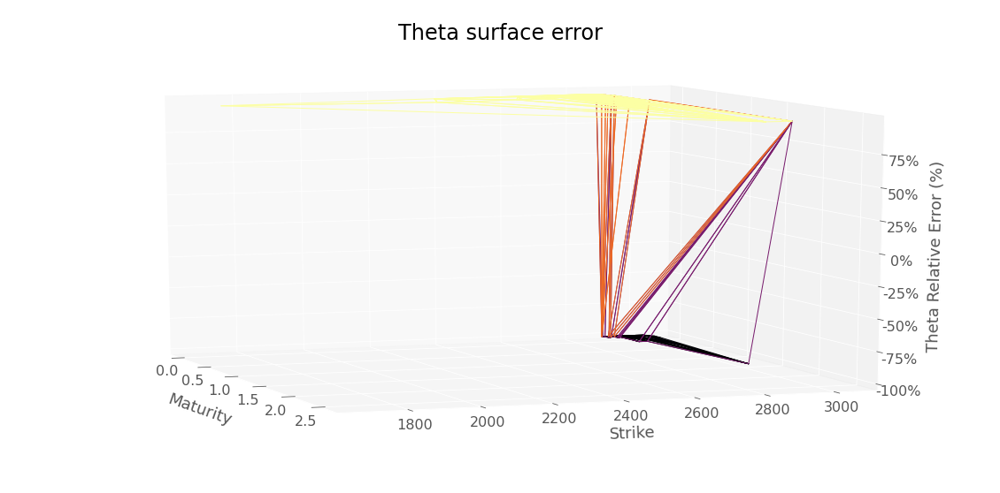

RMSE :  24524.889226745363


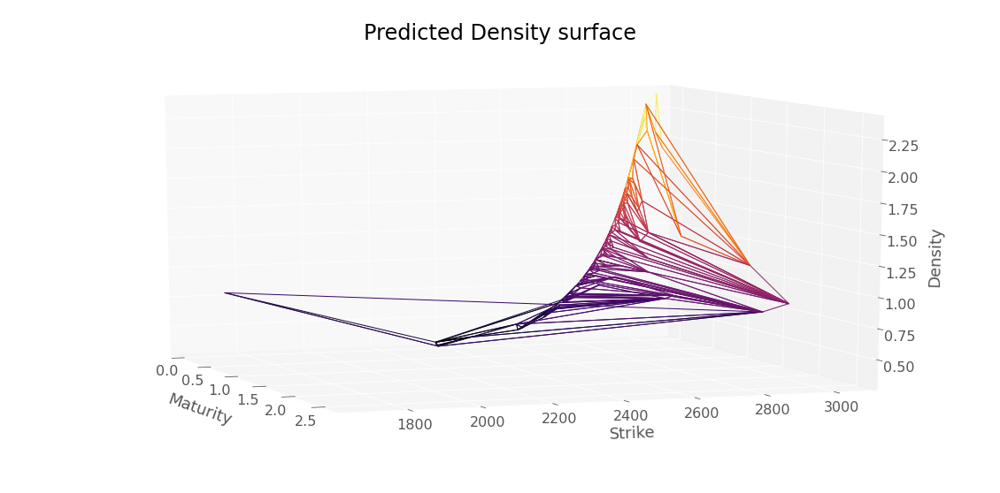

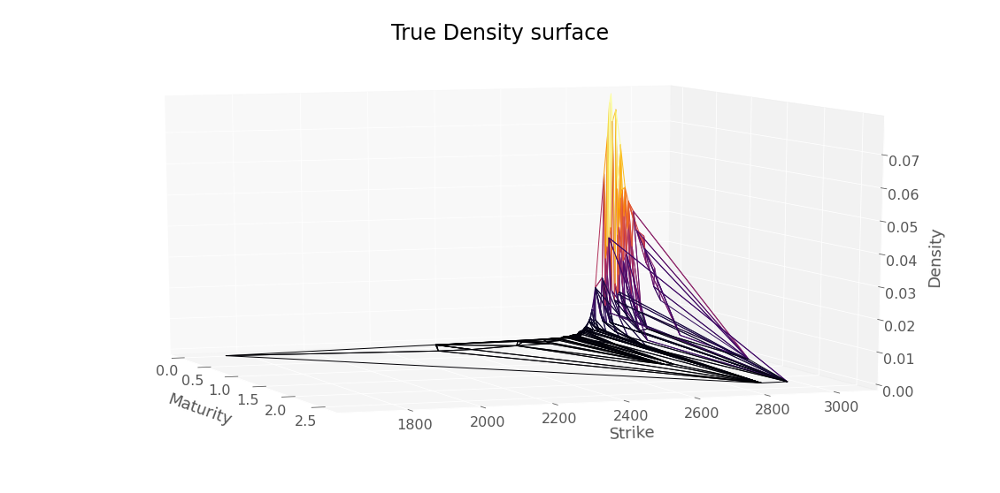

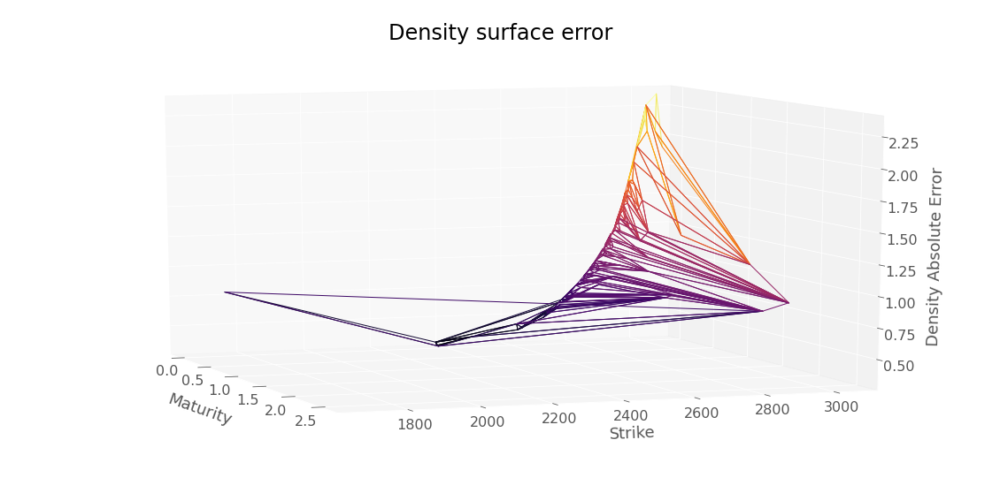

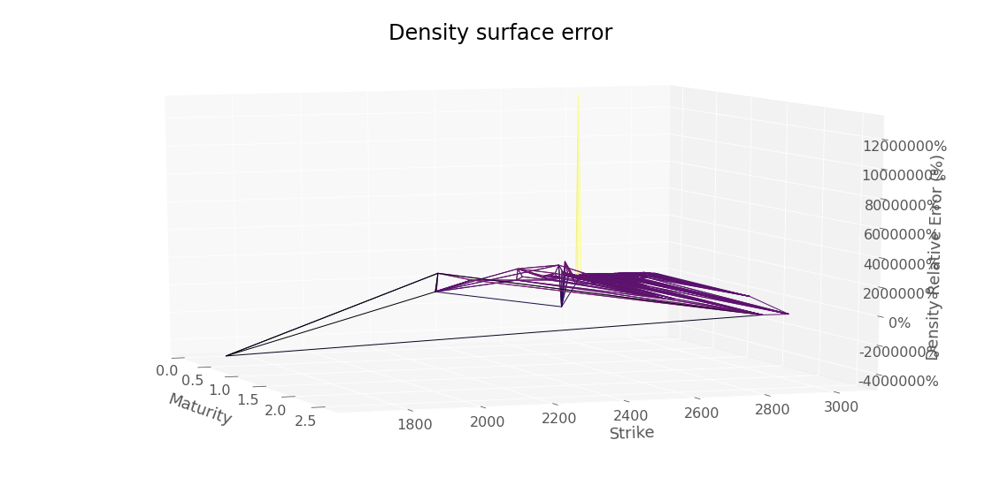

RMSE :  1.121941198210376


In [ ]:
res = neuralNetwork.create_eval_model_gatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               scaledDataSetTest,
                                               True,
                                               hyperparameters,
                                               scaler,
                                               modelName = "convexSoftGatheralVolModel")
y_pred4TestG, volLocale4TestG, dNN_T4TestG, gNN_K4TestG, lossSerie4TestG = res

plotTools.modelSummaryGatheral(y_pred4TestG, 
                               volLocale4TestG, 
                               dNN_T4TestG, 
                               gNN_K4TestG, 
                               dataSetTest,
                               yMin = KMin,
                               yMax = KMax)
neuralNetwork.saveDataModel(y_pred4TestG, 
                            volLocale4TestG, 
                            dNN_T4TestG, 
                            "convexSoftGatheralVolModelTest")

In [ ]:
plotTools.modelSummaryGatheral(y_pred4G[y_pred4G.index.get_level_values("Maturity") >= 0.19], 
                               volLocale4G[volLocale4G.index.get_level_values("Maturity") >= 0.19], 
                               dNN_T4G[dNN_T4G.index.get_level_values("Maturity") >= 0.19], 
                               gNN_K4G[gNN_K4G.index.get_level_values("Maturity") >= 0.19], 
                               dataSet[dataSet.index.get_level_values("Maturity") > 0.19],
                               logMoneynessScale = True)

In [ ]:
plotTools.modelSummaryGatheral(y_pred4TestG, 
                               volLocale4TestG, 
                               dNN_T4TestG, 
                               gNN_K4TestG, 
                               dataSetTest[dataSetTest.index.get_level_values("Maturity") > 0.01],
                               logMoneynessScale = True)

#### Monte Carlo and PDE repricing backtests

In [ ]:
S0

2859.53

In [ ]:
def neuralVolLocaleGatheral(s,t):
    vLoc = neuralNetwork.evalVolLocaleGatheral(neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                               s, t,
                                               dataSet,
                                               hyperparameters,
                                               scaler,
                                               bootstrap,
                                               S0,
                                               modelName = "convexSoftGatheralVolModel")
    return vLoc.dropna()

In [ ]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)

In [ ]:
volLocalInterp7 = neuralVolLocaleGatheral(volLocaleGrid[0].flatten(),
                                          volLocaleGrid[1].flatten())
volLocalInterp7.head()

Strike       Maturity
1700.000000  0.005       0.344780
1725.252525  0.005       0.345058
1750.505051  0.005       0.345357
1775.757576  0.005       0.345707
1801.010101  0.005       0.346142
dtype: float32

In [ ]:
volLocalInterp8 = neuralVolLocaleGatheral(dataSetTest.index.get_level_values("Strike").values.flatten(),
                                          dataSetTest.index.get_level_values("Maturity").values.flatten())
volLocalInterp8.head()

Strike  Maturity
1700.0  0.246       0.366481
2300.0  0.419       0.319022
2350.0  0.093       0.467738
        0.112       0.468346
2400.0  0.419       0.283373
dtype: float32

In [ ]:
nnVolLocale7 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp7, x, y)

In [ ]:
nnVolLocale8 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp8, x, y)

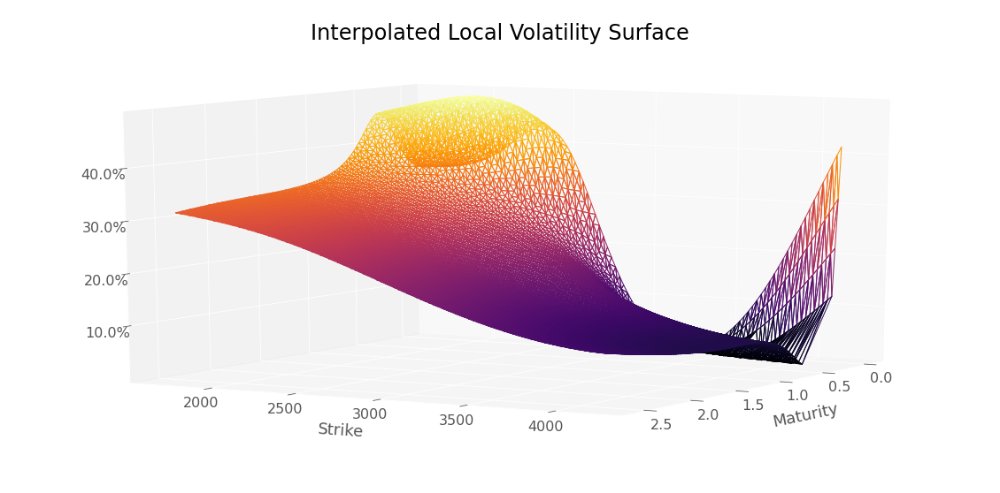

In [ ]:
plotTools.plotSerie(volLocalInterp7,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

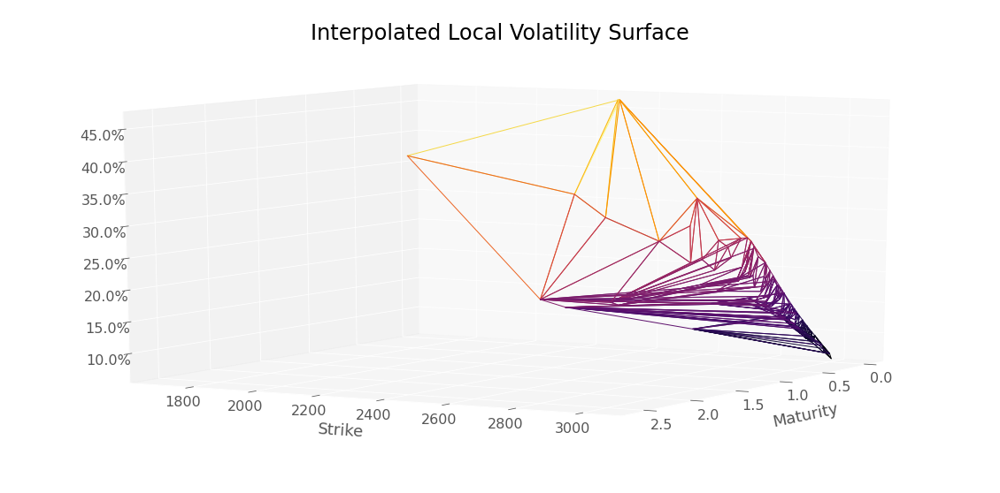

In [ ]:
plotTools.plotSerie(volLocalInterp8,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

In [ ]:
nbTimeStep = 100
nbPaths = 100000

In [ ]:
mcResVolLocale7 = backtest.MonteCarloPricerVectorized(S0,
                                                      dataSetTest,
                                                      bootstrap,
                                                      nbPaths,
                                                      nbTimeStep,
                                                      nnVolLocale7)
mcResVolLocale7.head()

Strike  Maturity
1700.0  0.246        0.112047
2300.0  0.419       13.605393
2350.0  0.093        1.097590
        0.112        1.766175
2400.0  0.419       18.821004
dtype: float64

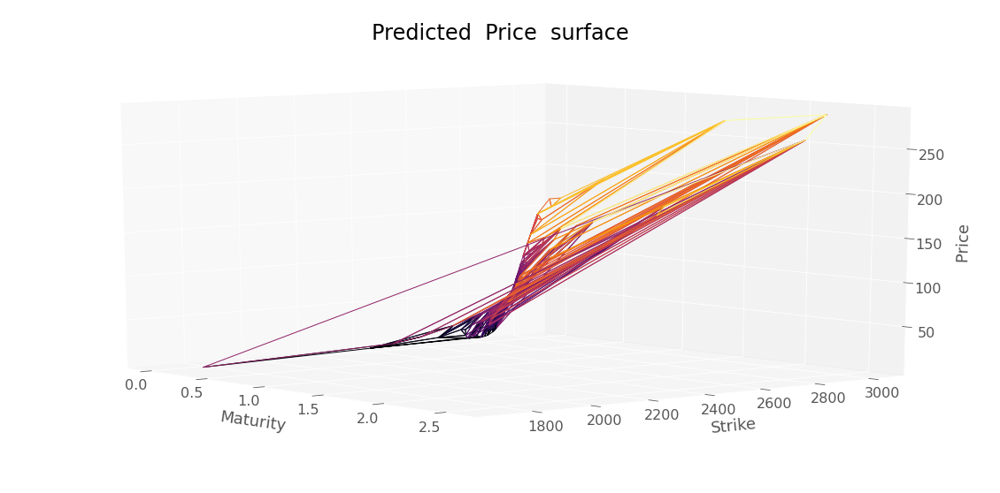

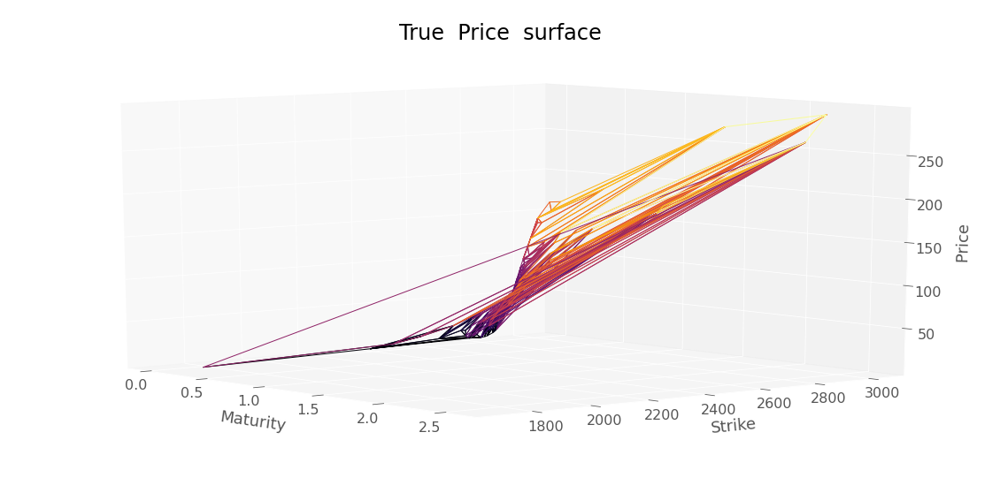

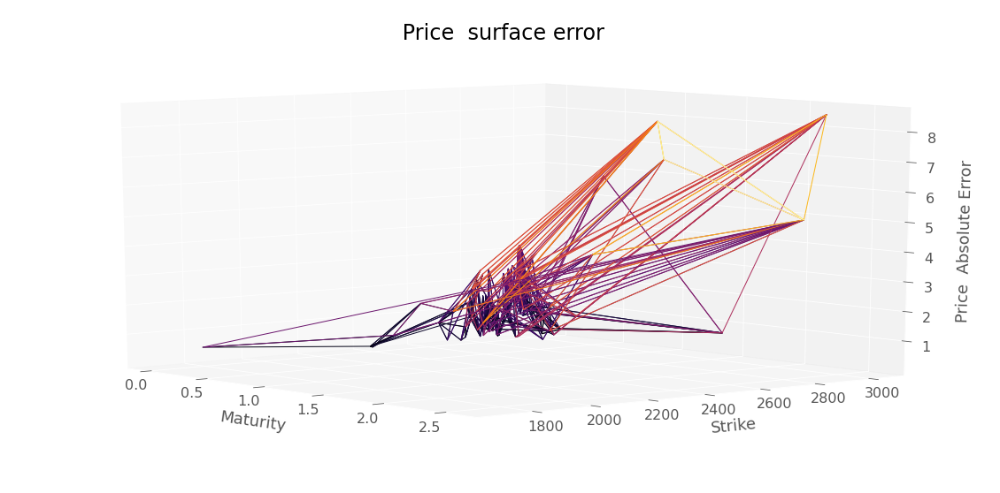

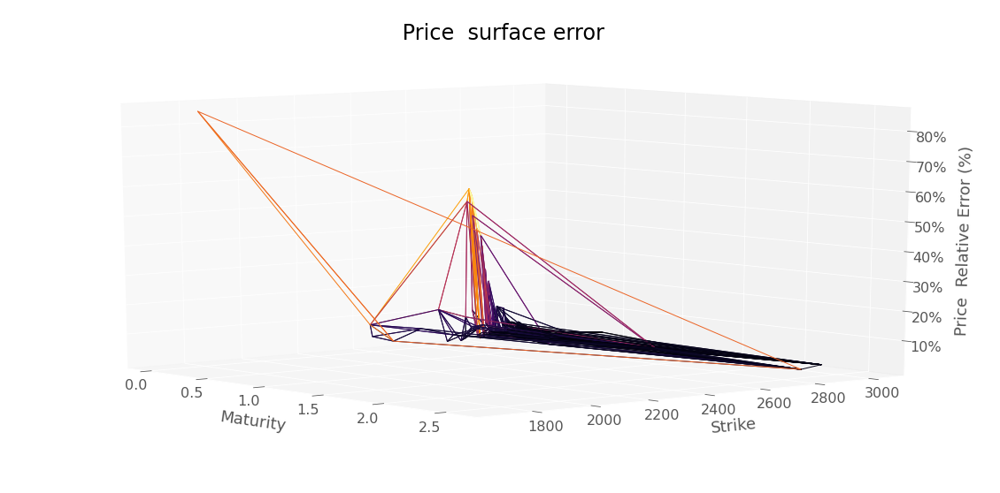

RMSE :  1.9222027101544683


In [ ]:
plotTools.predictionDiagnosis(mcResVolLocale7, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocale7.to_csv("mcResVolLocale7.csv")

In [ ]:
mcResVolLocale8 = backtest.MonteCarloPricerVectorized(S0,
                                                      dataSetTest,
                                                      bootstrap,
                                                      nbPaths,
                                                      nbTimeStep,
                                                      nnVolLocale8)
mcResVolLocale8.head()

Strike  Maturity
1700.0  0.246        0.075035
2300.0  0.419       13.631237
2350.0  0.093        0.913845
        0.112        1.549443
2400.0  0.419       19.146214
dtype: float64

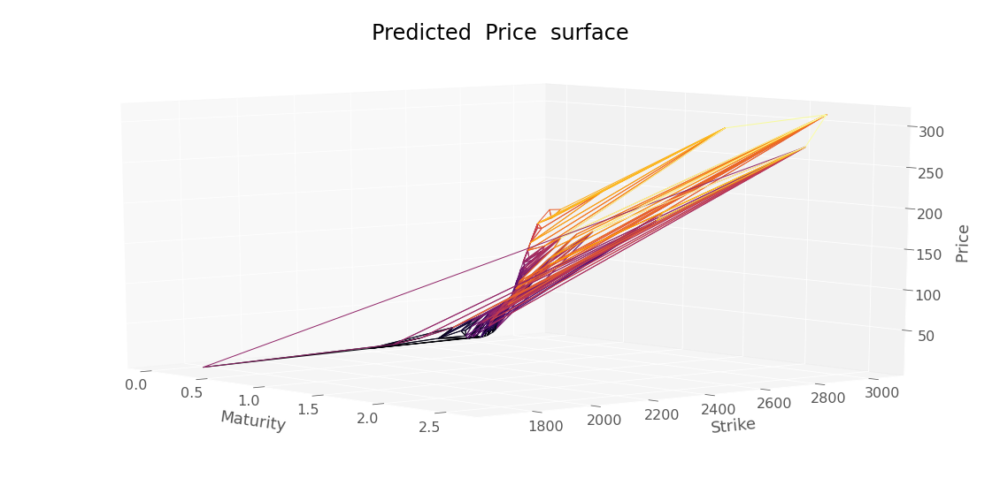

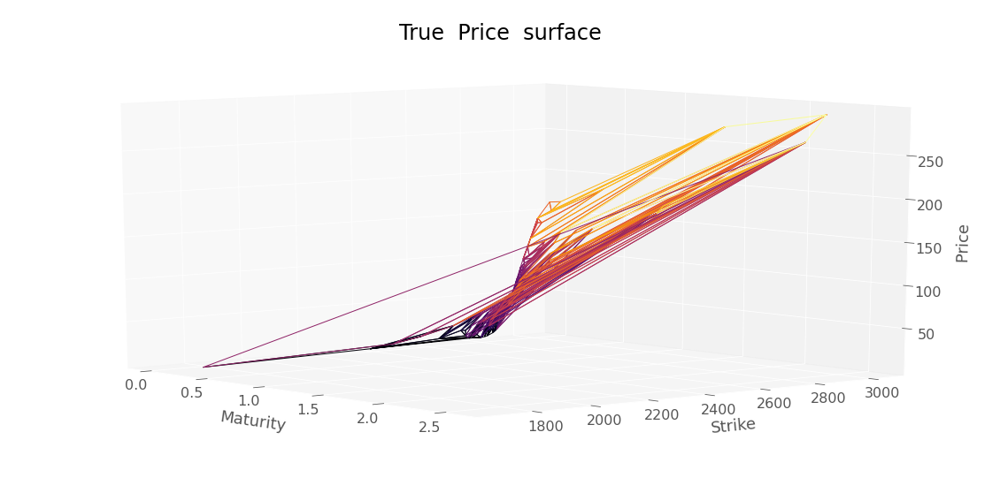

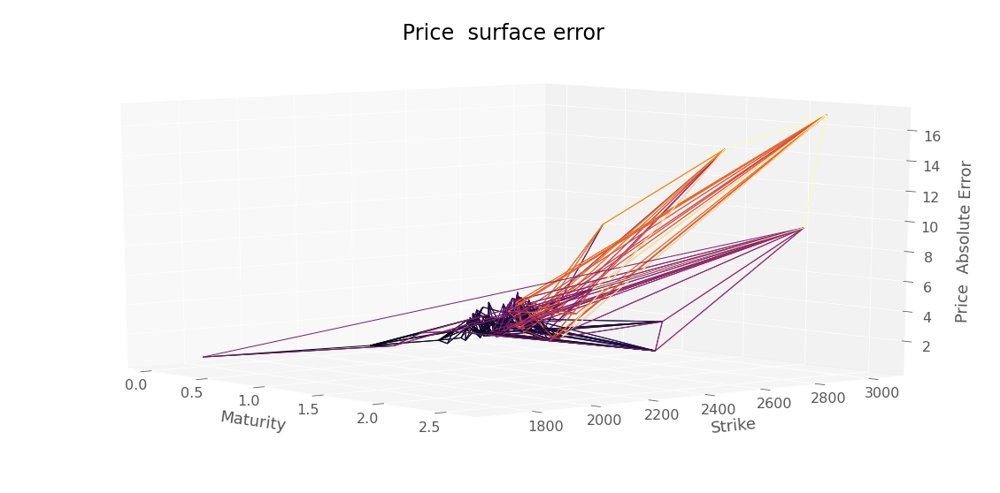

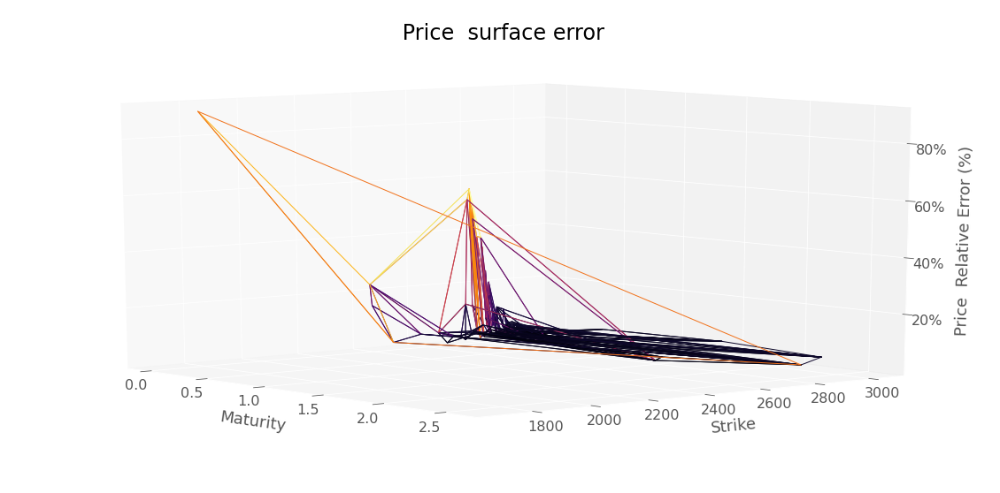

RMSE :  2.5512816400758305


In [ ]:
plotTools.predictionDiagnosis(mcResVolLocale8, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocale8.to_csv("mcResVolLocale8.csv")

# Learning Price

In [74]:
hyperparameters = {}
#penalization coefficient
hyperparameters["lambdaLocVol"] = 1#1#0.001#0.01 #100
hyperparameters["lambdaSoft"] = 100#100#0.0001#10#10 #100 
hyperparameters["lambdaGamma"] = 1000000#10000#100#10 #10000

#Derivative soft constraints parameters
hyperparameters["lowerBoundTheta"] = 0.01
hyperparameters["lowerBoundGamma"] = 0.00001

#Local variance parameters
hyperparameters["DupireVarCap"] = 10
hyperparameters["DupireVolLowerBound"] = 0.05
hyperparameters["DupireVolUpperBound"] = 0.40

#Learning scheduler coefficient
hyperparameters["LearningRateStart"] = 0.1
hyperparameters["Patience"] = 100
hyperparameters["batchSize"] = 50
hyperparameters["FinalLearningRate"] = 1e-6
hyperparameters["FixedLearningRate"] = False

#Training parameters
hyperparameters["nbUnits"] = 100 #number of units for hidden layers
hyperparameters["maxEpoch"] = 10000#10000 #maximum number of epochs

In [75]:
importlib.reload(plotTools)

<module 'plotTools' from '/content/plotTools.py'>

In [76]:
res = neuralNetwork.create_train_model(neuralNetwork.NNArchitectureVanillaSoftDupire,
                                       scaledDataSet,
                                       True,
                                       hyperparameters,
                                       scaler,
                                       modelName = "convexSoftVolModel")
y_pred4, volLocale4, dNN_T4, gNN_K4, lossSerie4 = res

Iteration :  445 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 100, iterations: 446): 1.72
Best Penalization :  [5.576217, [0.0, 0.018617714, 0.06351783]]
Best Penalization (Refined Grid) :  [[0.0, 0.0019161281, 0.029031033]]
Iteration :  1518 new learning rate :  0.0010000000000000002
Best loss (hidden nodes: 100, iterations: 1519): -0.08
Best Penalization :  [0.91840994, [0.0, 1.2230396, 0.11749238]]
Best Penalization (Refined Grid) :  [[0.0, 0.0002662222, 0.007578557]]
Iteration :  5046 new learning rate :  0.00010000000000000003
Best loss (hidden nodes: 100, iterations: 5047): -0.38
Best Penalization :  [0.6809773, [0.0, 1.1475809, 0.004908175]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.004047934]]
Iteration :  7331 new learning rate :  1.0000000000000004e-05
Best loss (hidden nodes: 100, iterations: 7332): -0.39
Best Penalization :  [0.6731149, [0.0, 1.1808288, 0.004470908]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0040195724]]
Best loss (hidd

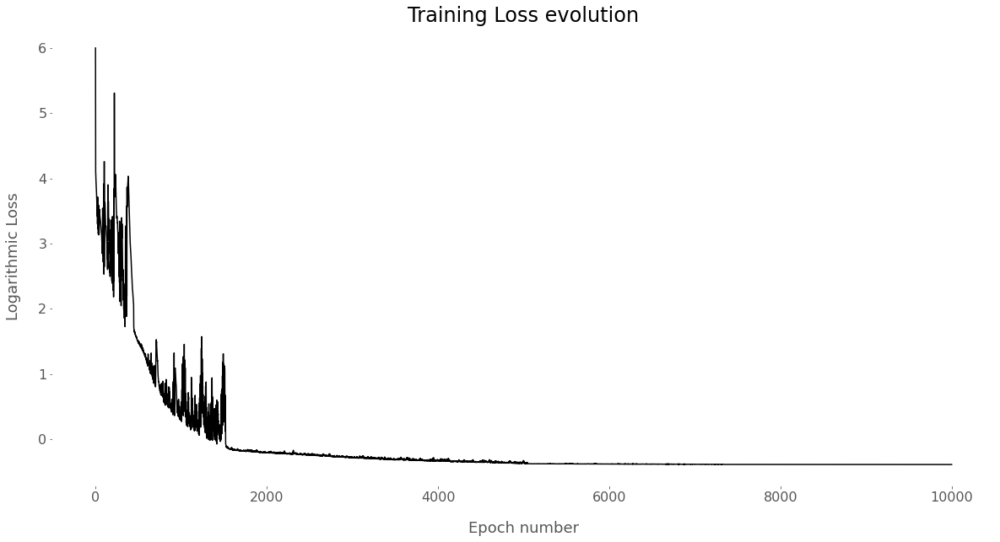

-0.3915337324142456

In [77]:
plotTools.plotEpochLoss(lossSerie4)
lossSerie4.iloc[-1]

Best loss (hidden nodes: 100, iterations: 0): 0.62
Best Penalization :  [0.6718657, [0.0, 1.1862838, 0.004436095]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0040242537]]
Number of static arbitrage violations :  3
Arbitrable total variance :  Strike  Maturity
2975.0  0.005       111.923897
3040.0  0.093       179.135620
3100.0  0.093       237.549957
Name: Price, dtype: float32


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


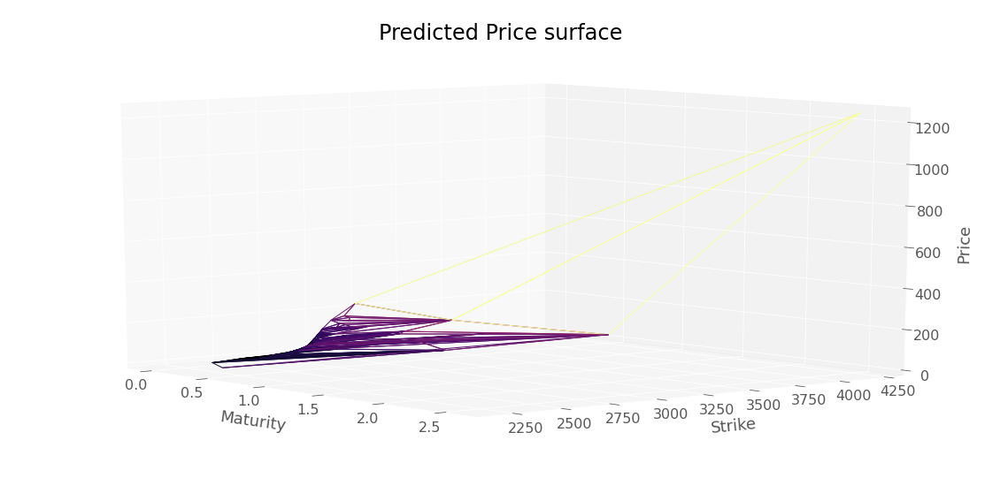

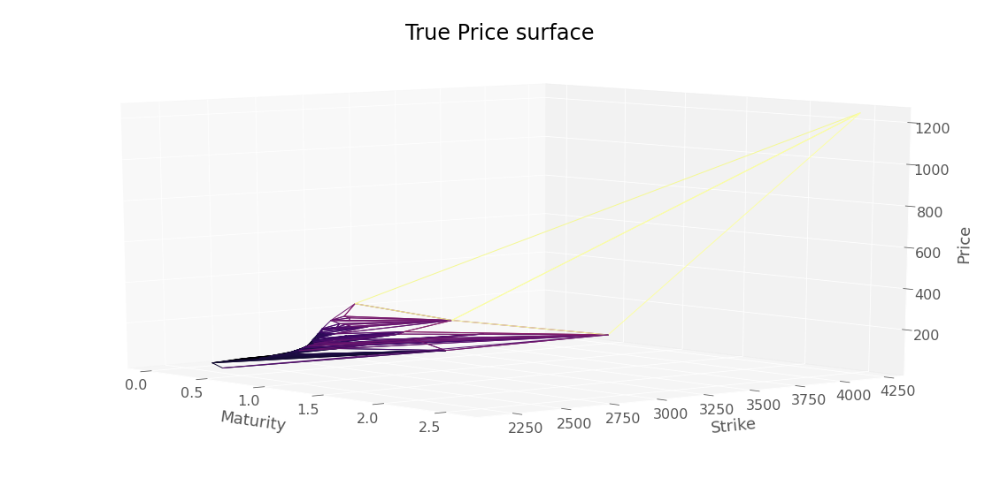

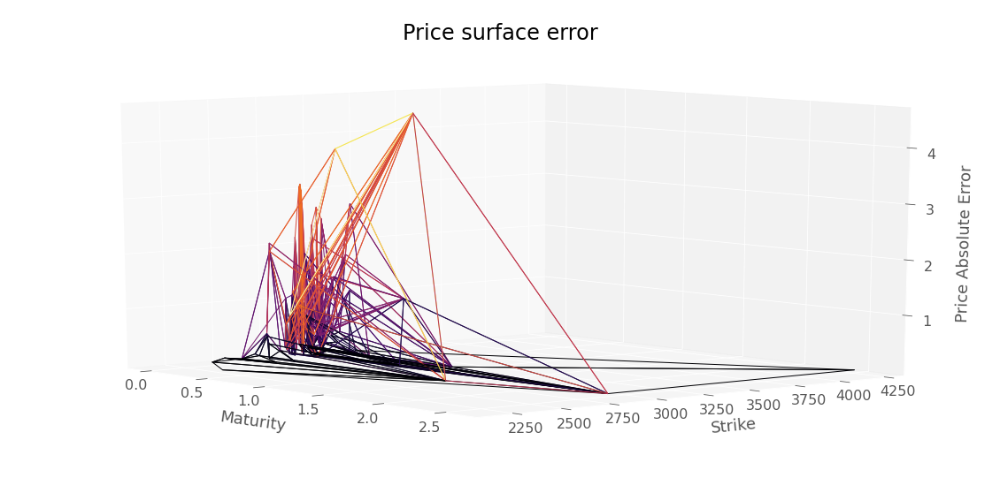

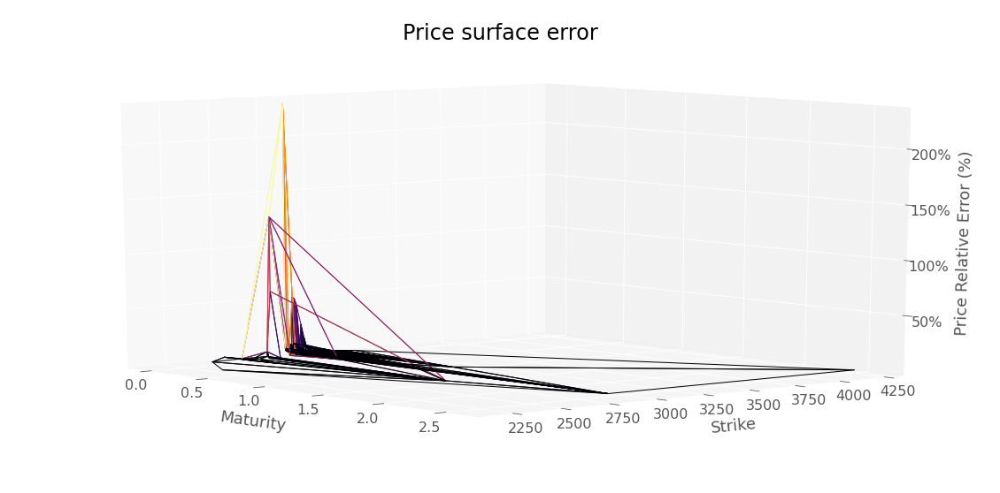

RMSE :  1.1144118643255123


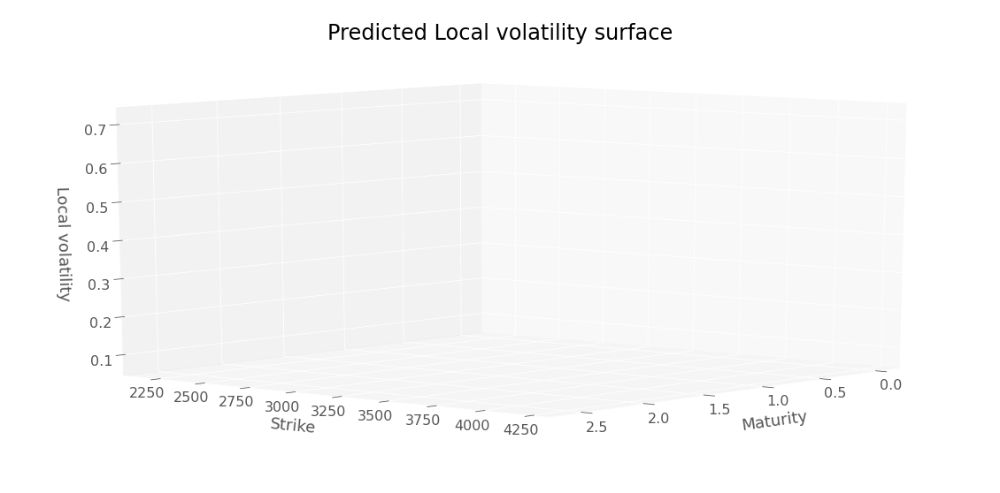

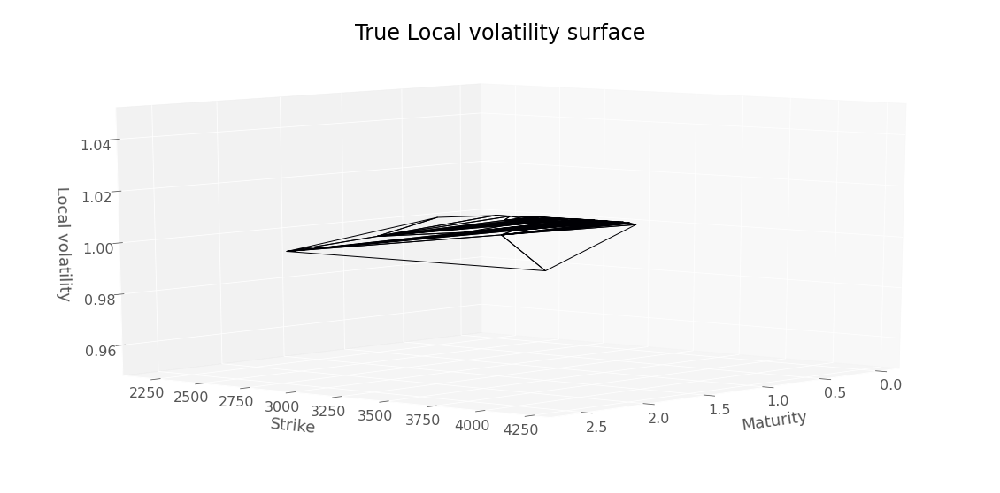

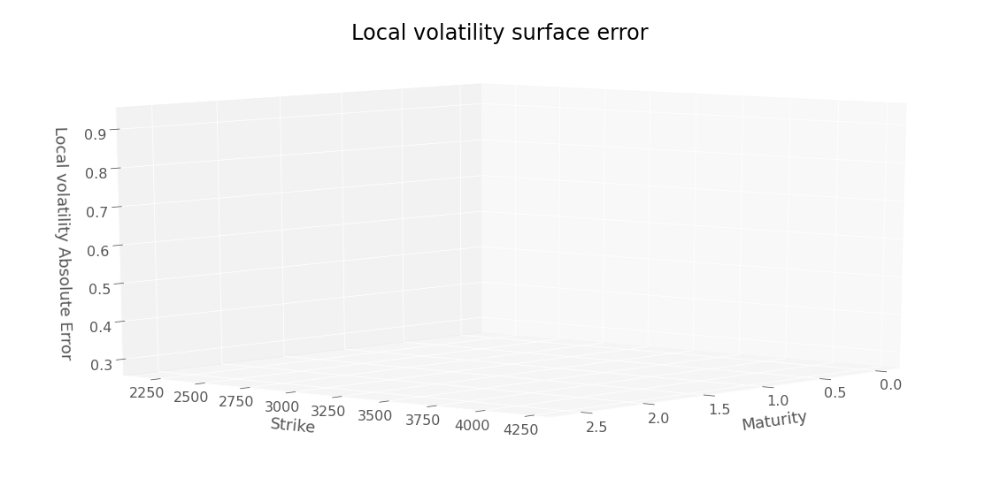

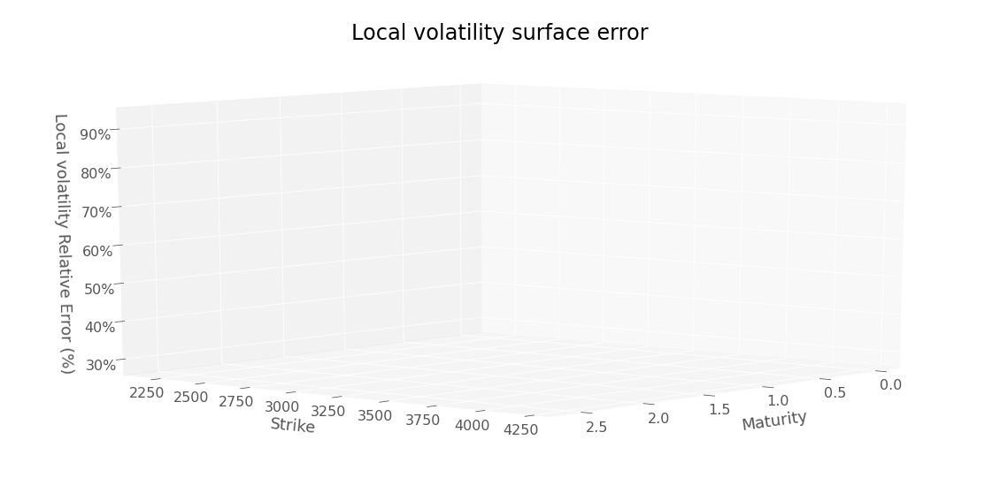

RMSE :  0.8068247319329825


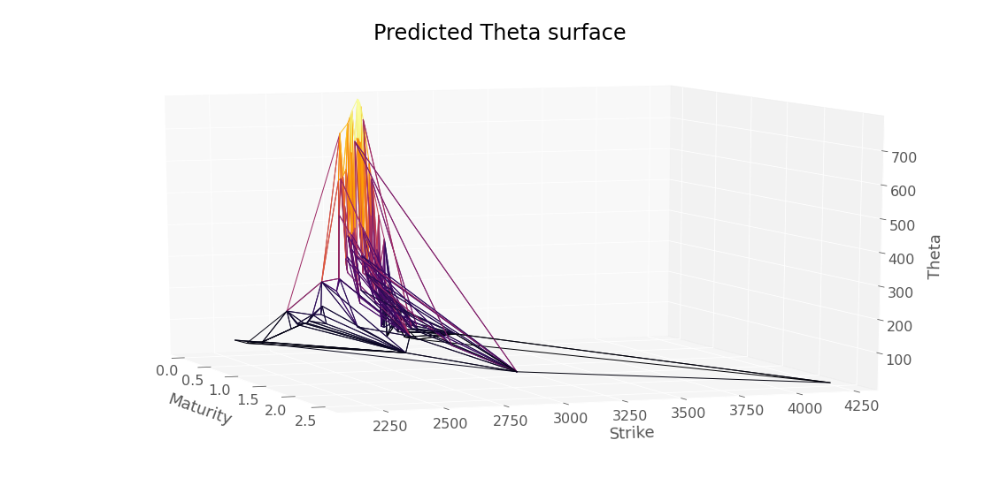

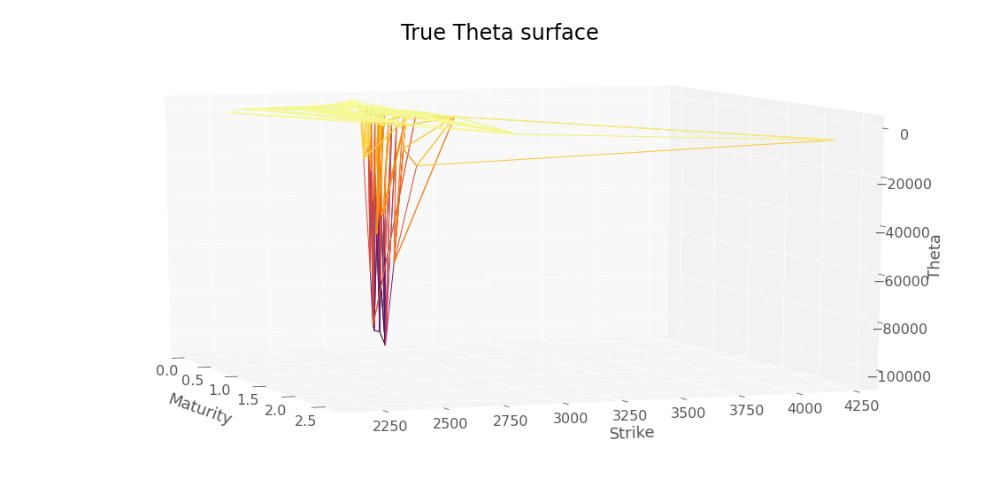

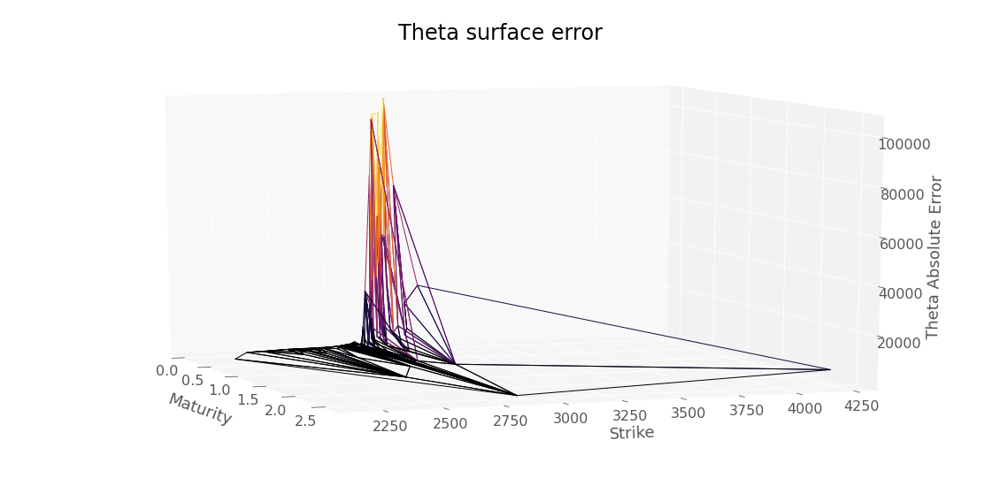

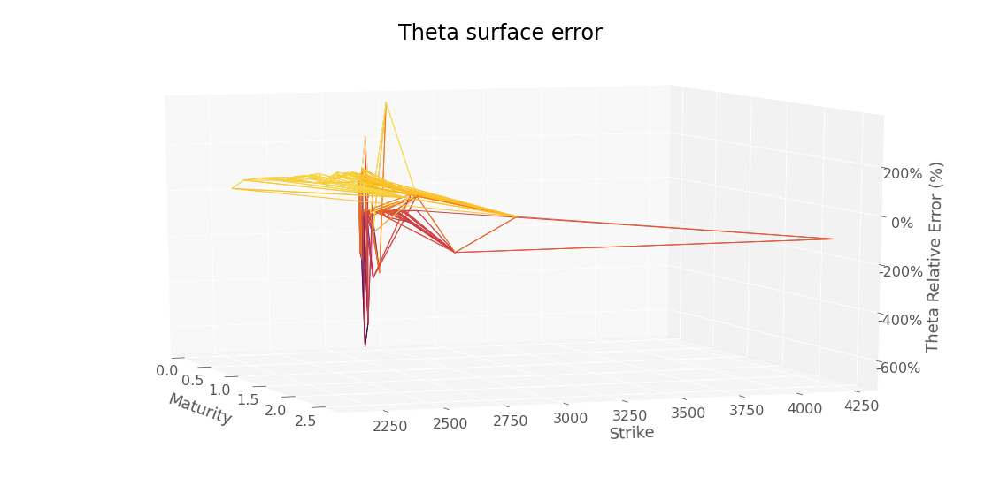

RMSE :  24521.179251594956


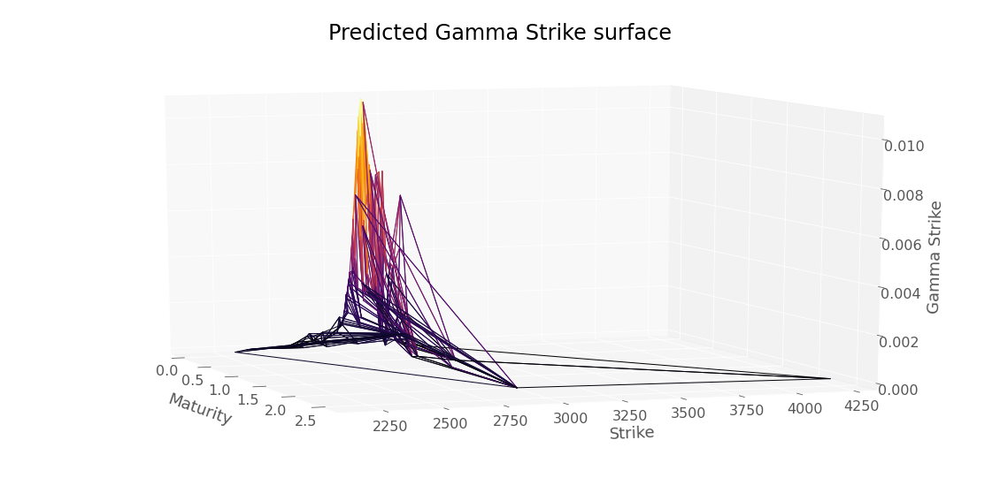

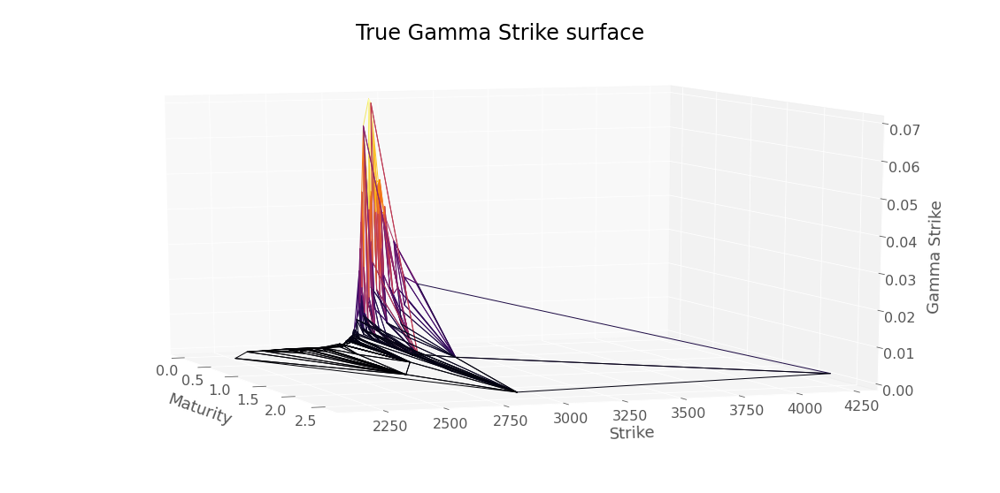

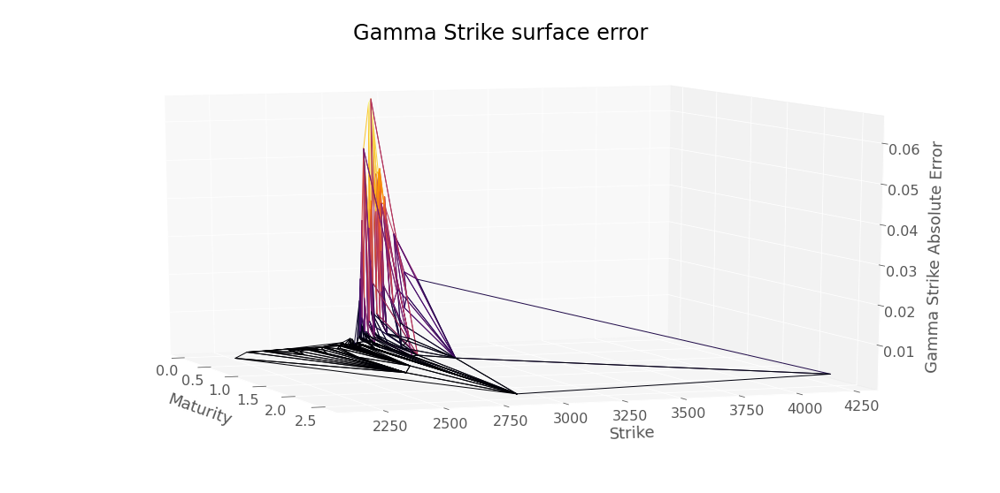

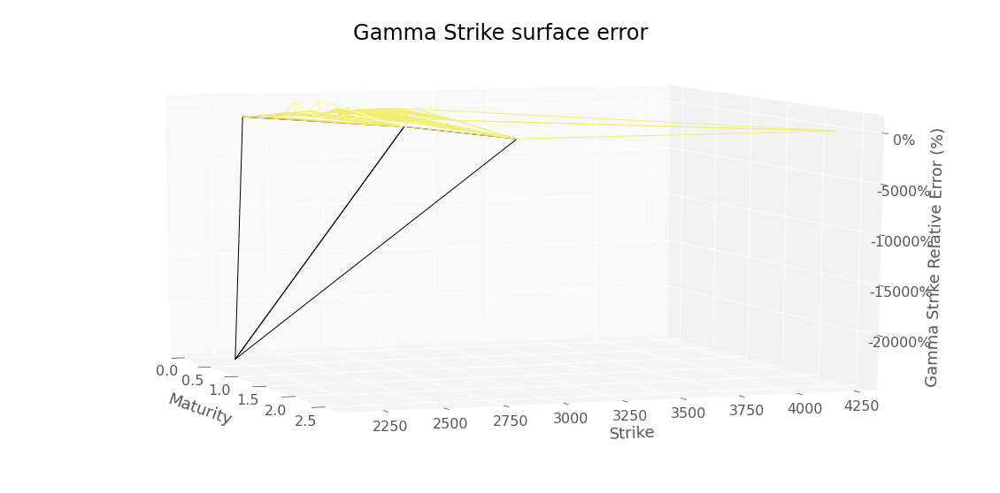

RMSE :  0.018514638169429623


In [78]:
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureVanillaSoftDupire,
                                      scaledDataSet,
                                      True,
                                      hyperparameters,
                                      scaler,
                                      modelName = "convexSoftVolModel")
y_pred4, volLocale4, dNN_T4, gNN_K4, lossSerie4 = res

plotTools.modelSummary(y_pred4,
                       volLocale4, 
                       dNN_T4, 
                       gNN_K4, 
                       dataSet,
                       yMin = KMin,
                       yMax = KMax)
neuralNetwork.saveDataModel(y_pred4, 
                            volLocale4, 
                            dNN_T4, 
                            "convexSoftVolModelTrain")

In [79]:
volLocale4.loc[(midS0,slice(None))]

Strike  Maturity
2860.0  0.005       0.143134
        0.011       0.140513
        0.036       0.141150
        0.074       0.158902
        0.112       0.159364
        0.285       0.131607
Name: Dupire, dtype: float32

Best loss (hidden nodes: 100, iterations: 0): 0.41
Best Penalization :  [1.4926573, [0.0, 0.0, 0.007568853]]
Best Penalization (Refined Grid) :  [[0.0, 0.0, 0.0040242537]]
Number of static arbitrage violations :  0
Arbitrable total variance :  Series([], Name: Price, dtype: float32)


/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "
/usr/local/lib/python3.6/dist-packages/pandas/core/computation/expressions.py:201: UserWarning: evaluating in Python space because the '+' operator is not supported by numexpr for the bool dtype, use '|' instead
  f"evaluating in Python space because the {repr(op_str)} "


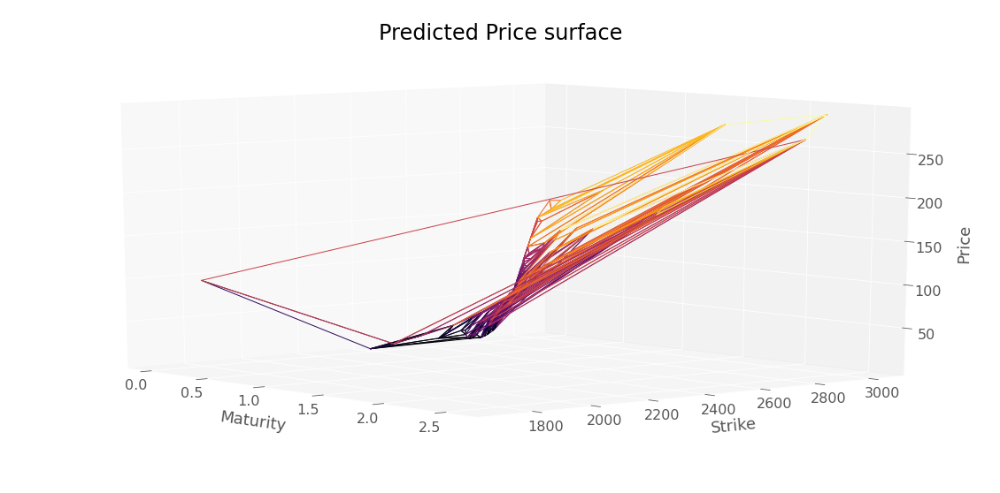

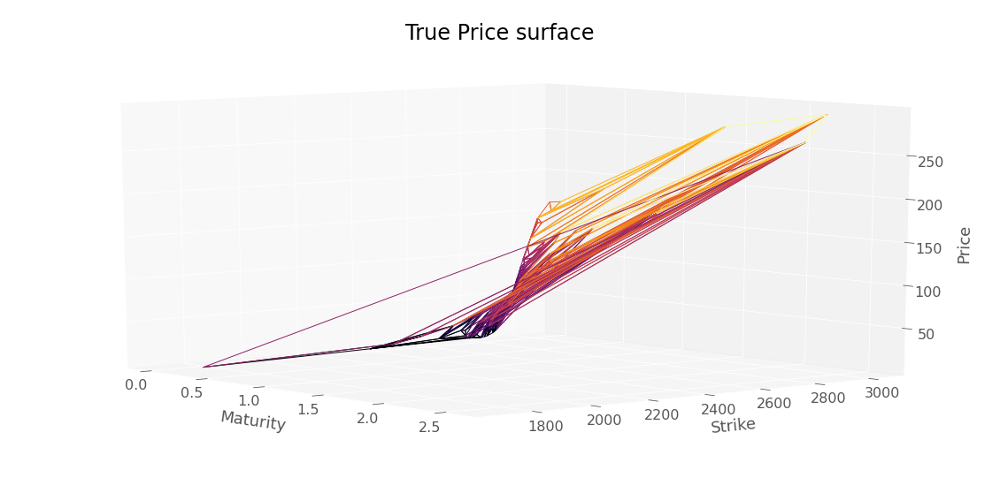

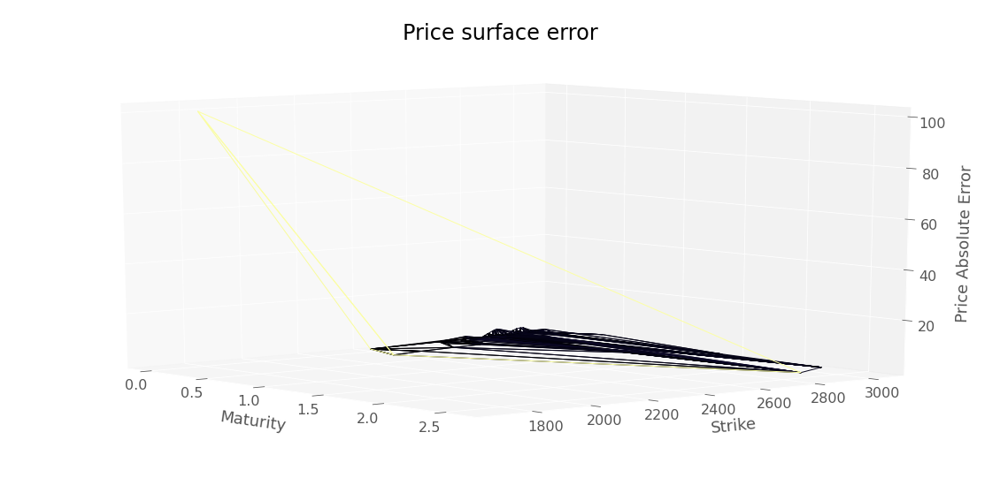

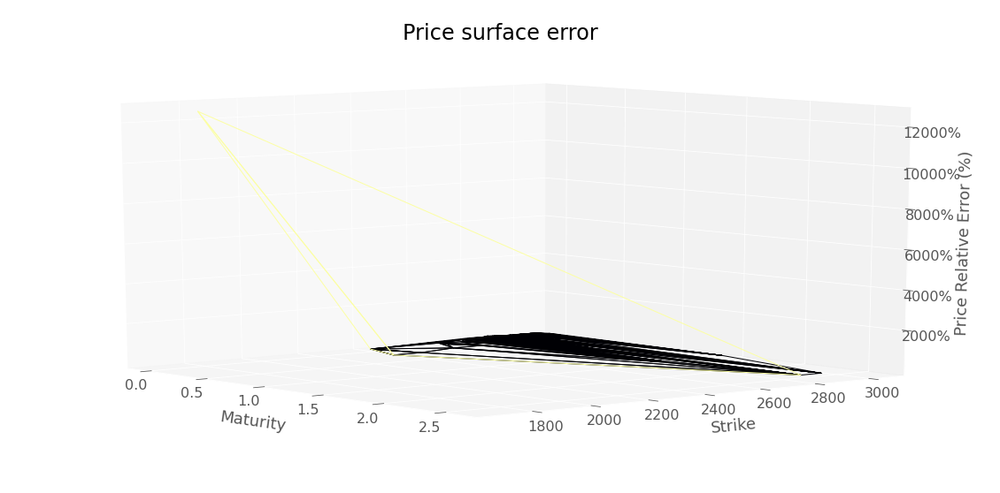

RMSE :  8.5363710351478


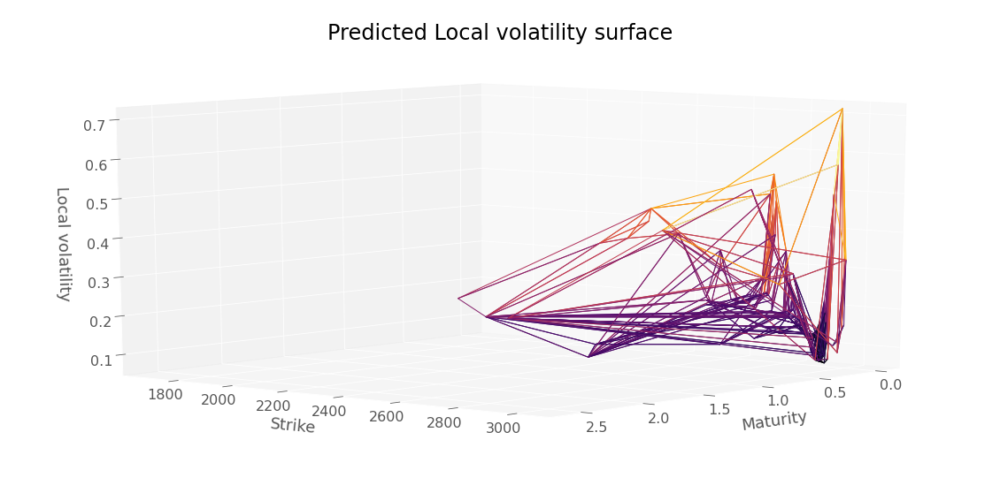

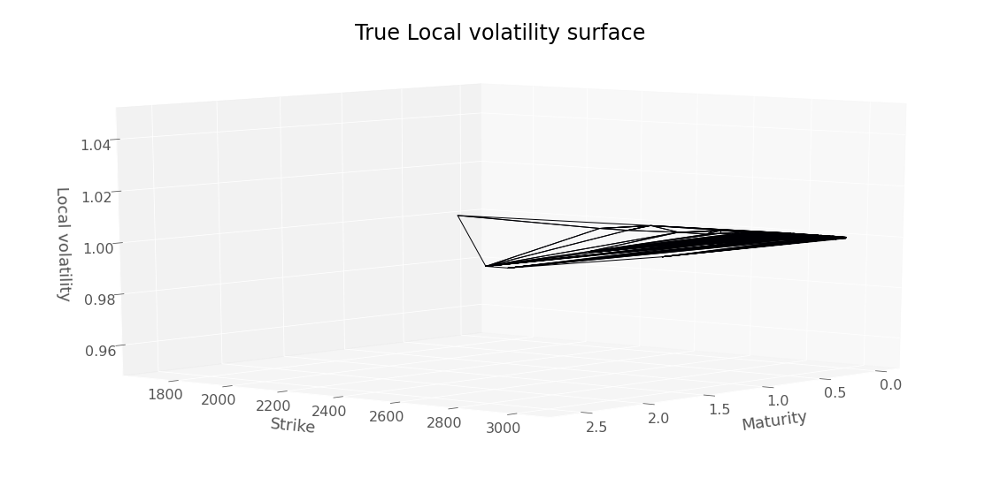

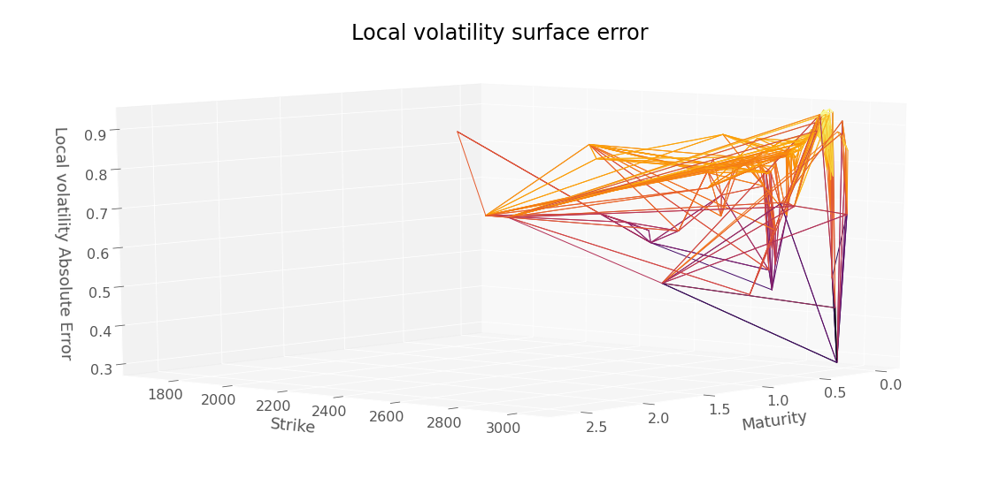

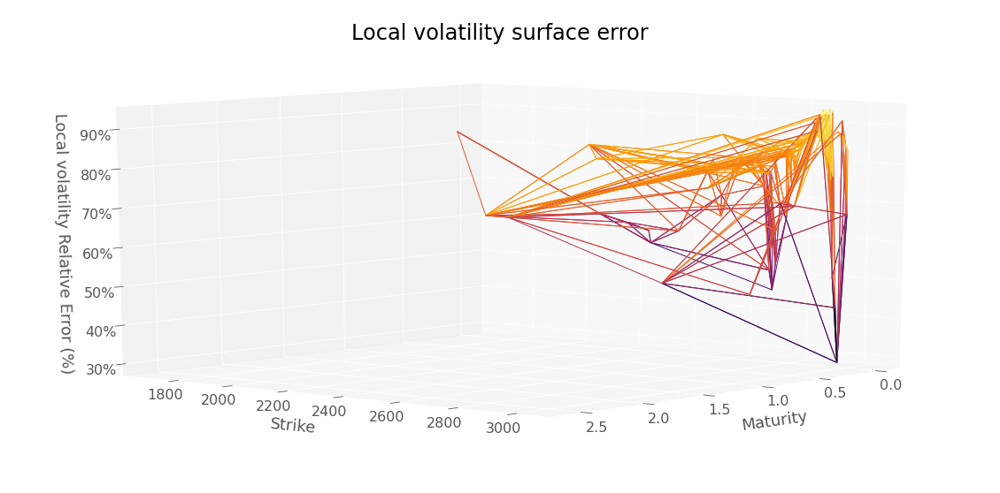

RMSE :  0.8085059196137427


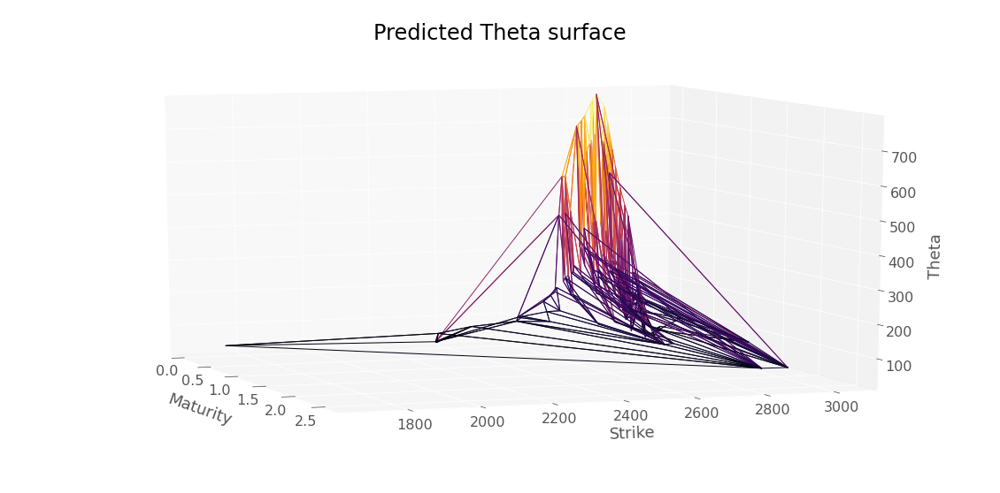

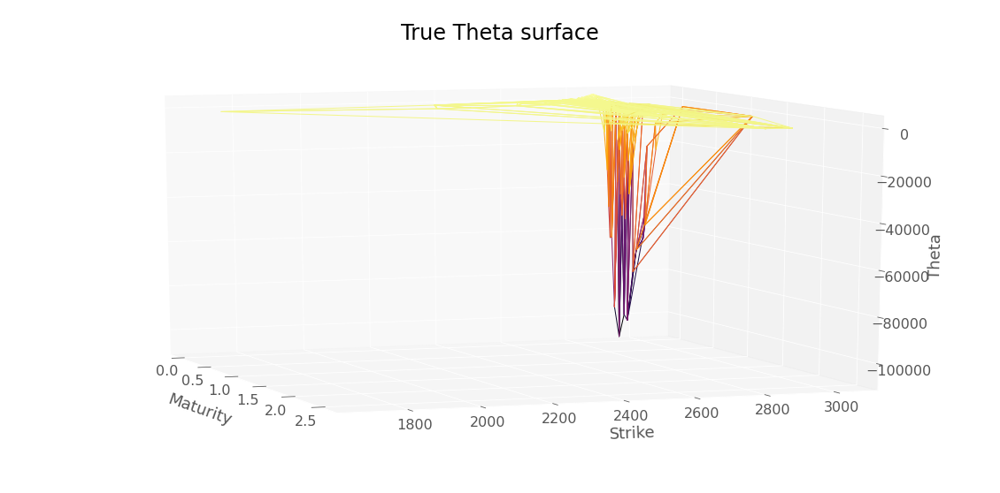

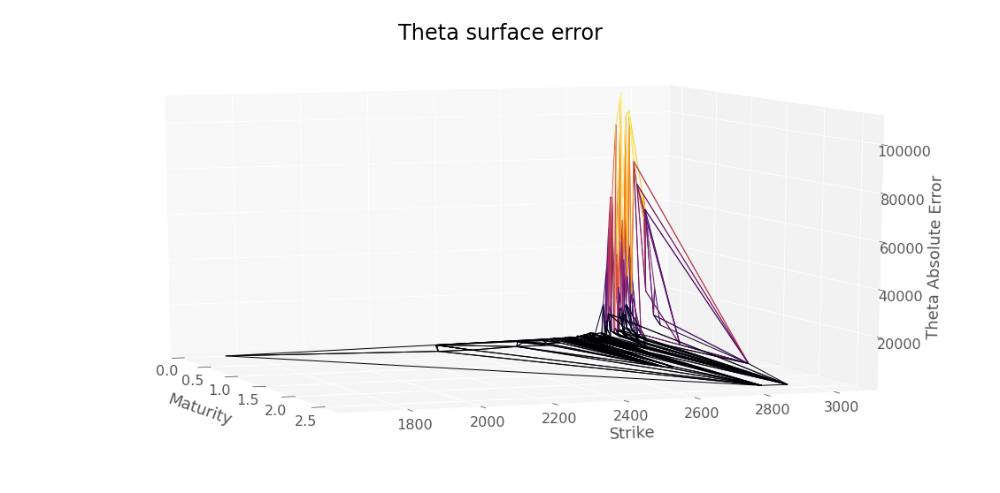

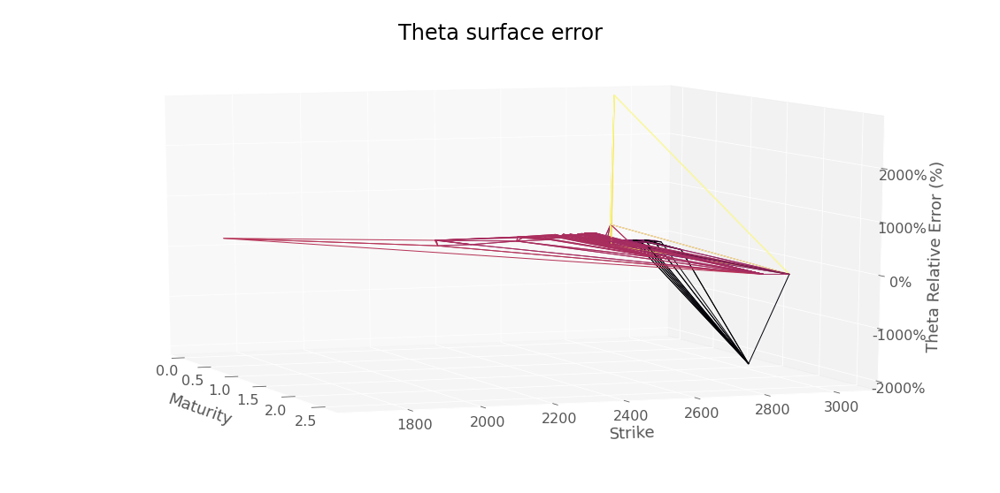

RMSE :  25167.711759759677


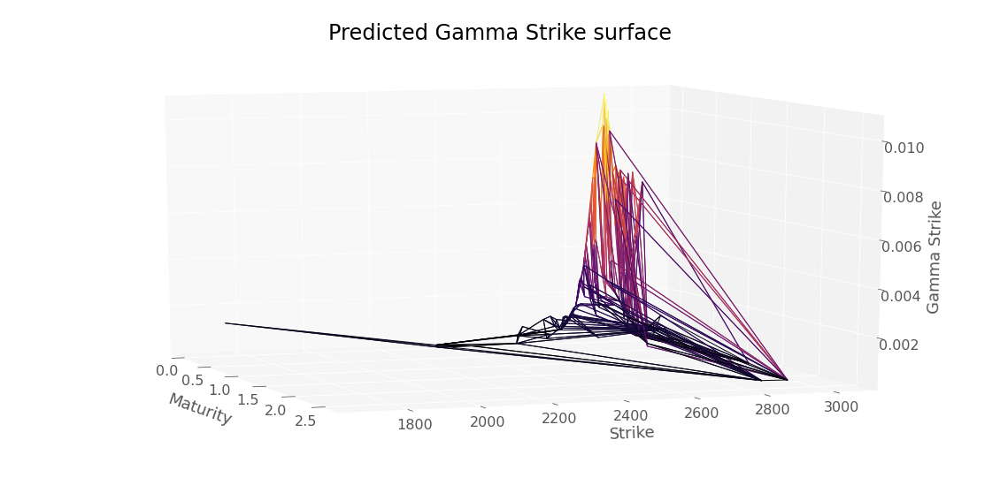

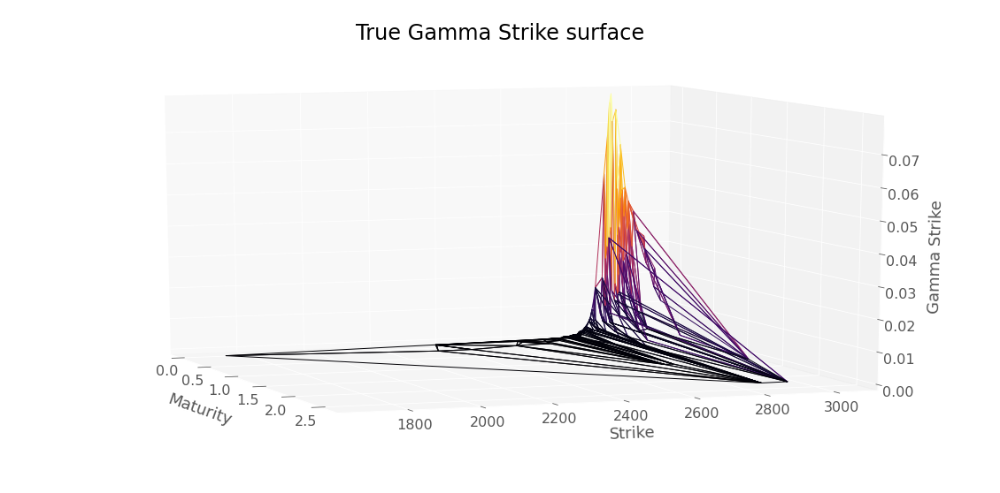

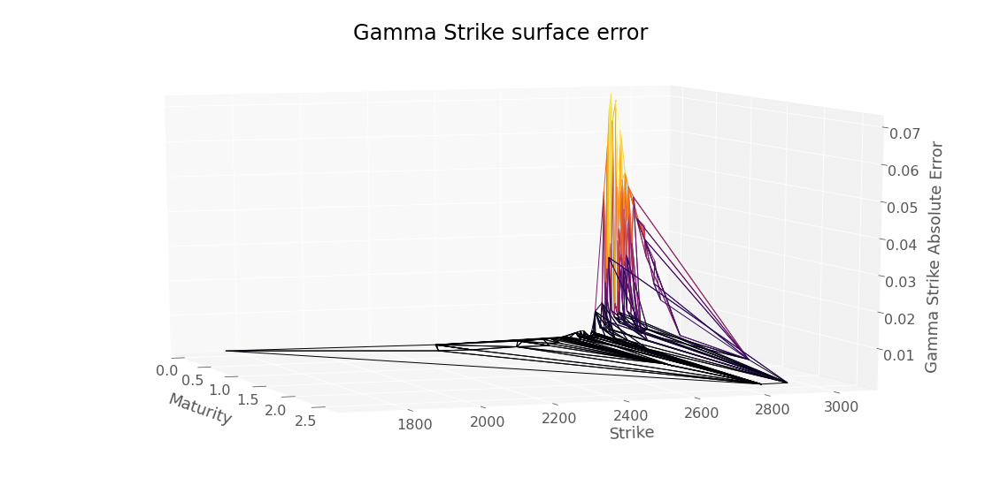

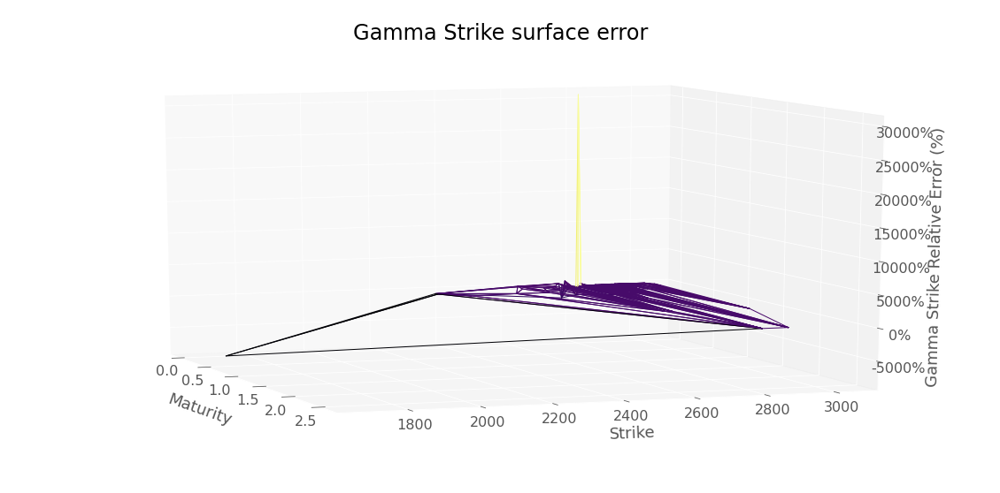

RMSE :  0.020348036240852657


In [80]:
res = neuralNetwork.create_eval_model(neuralNetwork.NNArchitectureVanillaSoftDupire,
                                      scaledDataSetTest,
                                      True,
                                      hyperparameters,
                                      scaler,
                                      modelName = "convexSoftVolModel")
y_pred4Test, volLocale4Test, dNN_T4Test, gNN_K4Test, lossSerie4TestG = res

plotTools.modelSummary(y_pred4Test,
                       volLocale4Test,
                       dNN_T4Test,
                       gNN_K4Test,
                       dataSetTest,
                       yMin = KMin,
                       yMax = KMax)
neuralNetwork.saveDataModel(y_pred4Test, 
                            volLocale4Test, 
                            dNN_T4Test, 
                            "convexSoftVolModelTest")

#### Monte Carlo and PDE repricing backtests

In [ ]:
S0

2859.53

In [ ]:
def neuralVolLocalePrix(s,t):
    vLoc = neuralNetwork.evalVolLocalePrix(neuralNetwork.NNArchitectureVanillaSoftPrix,
                                           s, t,
                                           dataSet,
                                           hyperparameters,
                                           scaler,
                                           bootstrap,
                                           S0,
                                           modelName = "convexSoftVolModel")
    return vLoc.dropna()

In [ ]:
strikeLow = min(dataSet["Strike"].min(),dataSetTest["Strike"].min()) #dataSet["Strike"].min()
strikeUp = max(dataSet["Strike"].max(),dataSetTest["Strike"].max()) #dataSet["Strike"].max()
strikeGrid = np.linspace(strikeLow, strikeUp, 100)
matLow = min(dataSet["Maturity"].min(),dataSetTest["Maturity"].min()) #dataSet["Maturity"].min()
matUp = max(dataSet["Maturity"].max(),dataSetTest["Maturity"].max()) #dataSetTest["Maturity"].max()
matGrid = np.linspace(matLow, matUp, 100)
volLocaleGrid = np.meshgrid(strikeGrid, matGrid)

In [ ]:
volLocalInterp = neuralVolLocaleGatheral(volLocaleGrid[0].flatten(),
                                         volLocaleGrid[1].flatten())
volLocalInterp.head()

Strike       Maturity
1700.000000  0.005       0.344780
1725.252525  0.005       0.345058
1750.505051  0.005       0.345357
1775.757576  0.005       0.345707
1801.010101  0.005       0.346142
dtype: float32

In [ ]:
volLocalInterp = neuralVolLocaleGatheral(dataSetTest.index.get_level_values("Strike").values.flatten(),
                                         dataSetTest.index.get_level_values("Maturity").values.flatten())
volLocalInterp.head()

Strike  Maturity
1700.0  0.246       0.366481
2300.0  0.419       0.319022
2350.0  0.093       0.467738
        0.112       0.468346
2400.0  0.419       0.283373
dtype: float32

In [ ]:
nnVolLocale = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp, x, y)

In [ ]:
nnVolLocale2 = lambda x,y : backtest.interpolatedMCLocalVolatility(volLocalInterp, x, y)

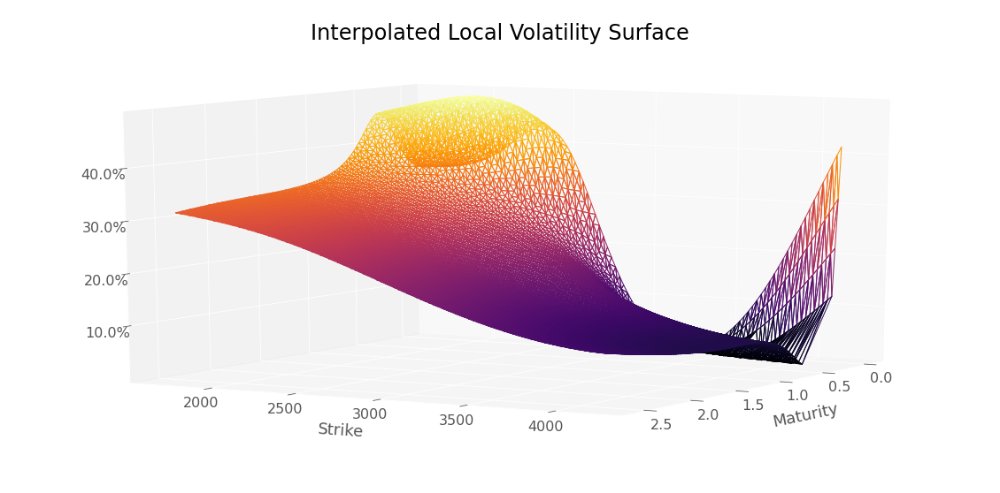

In [ ]:
plotTools.plotSerie(volLocalInterp,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

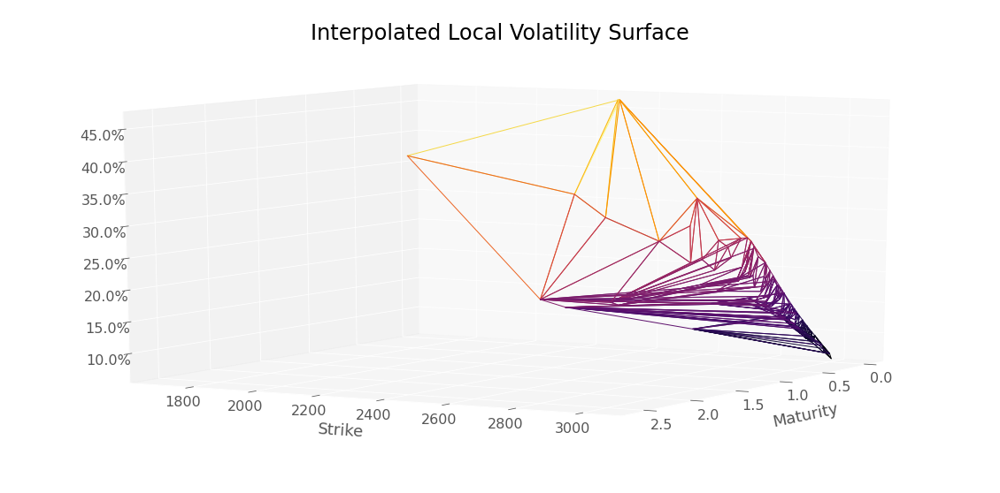

In [ ]:
plotTools.plotSerie(volLocalInterp2,
                    Title = 'Interpolated Local Volatility Surface',
                    az=30,
                    yMin=KMin,
                    yMax=KMax,
                    zAsPercent=True)

In [ ]:
nbTimeStep = 100
nbPaths = 100000

In [ ]:
mcResVolLocalePrix = backtest.MonteCarloPricerVectorized(S0,
                                                         dataSetTest,
                                                         bootstrap,
                                                         nbPaths,
                                                         nbTimeStep,
                                                         nnVolLocale)
mcResVolLocalePrix.head()

Strike  Maturity
1700.0  0.246        0.112047
2300.0  0.419       13.605393
2350.0  0.093        1.097590
        0.112        1.766175
2400.0  0.419       18.821004
dtype: float64

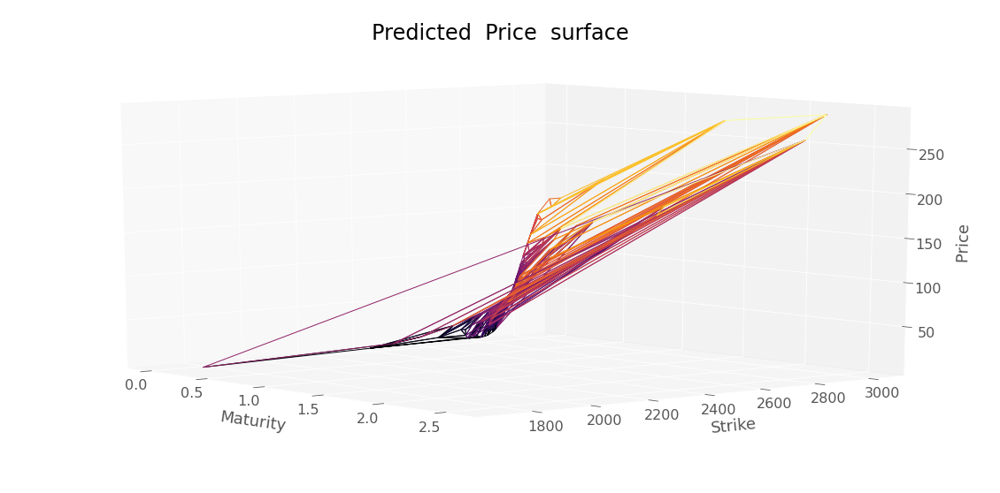

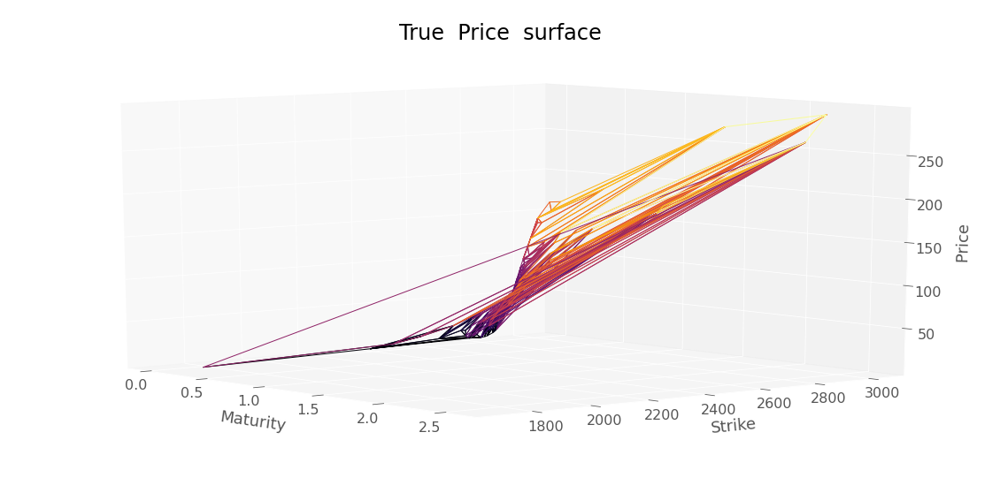

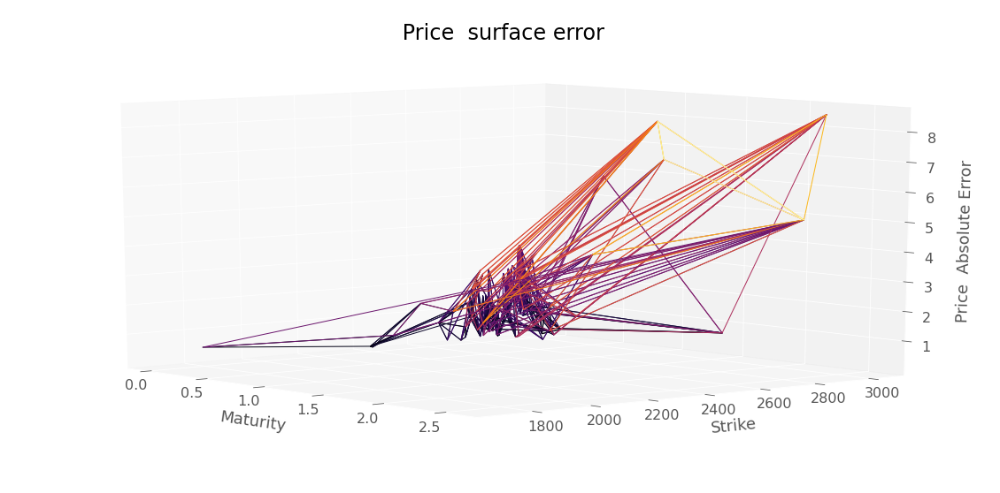

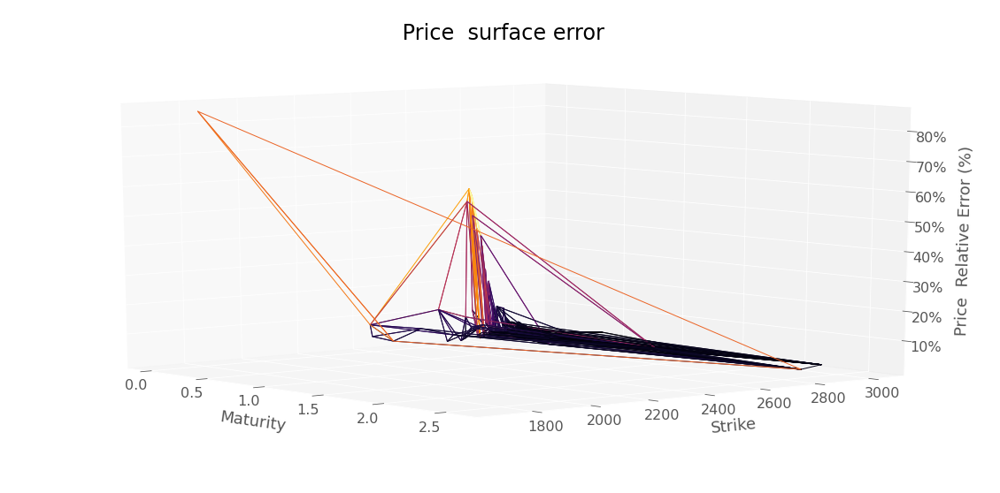

RMSE :  1.9222027101544683


In [ ]:
plotTools.predictionDiagnosis(mcResVolLocalePrix, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocalePrix.to_csv("mcResVolLocalePrix.csv")

In [ ]:
mcResVolLocalePrix2 = backtest.MonteCarloPricerVectorized(S0,
                                                          dataSetTest,
                                                          bootstrap,
                                                          nbPaths,
                                                          nbTimeStep,
                                                          nnVolLocale2)
mcResVolLocalePrix2.head()

Strike  Maturity
1700.0  0.246        0.075035
2300.0  0.419       13.631237
2350.0  0.093        0.913845
        0.112        1.549443
2400.0  0.419       19.146214
dtype: float64

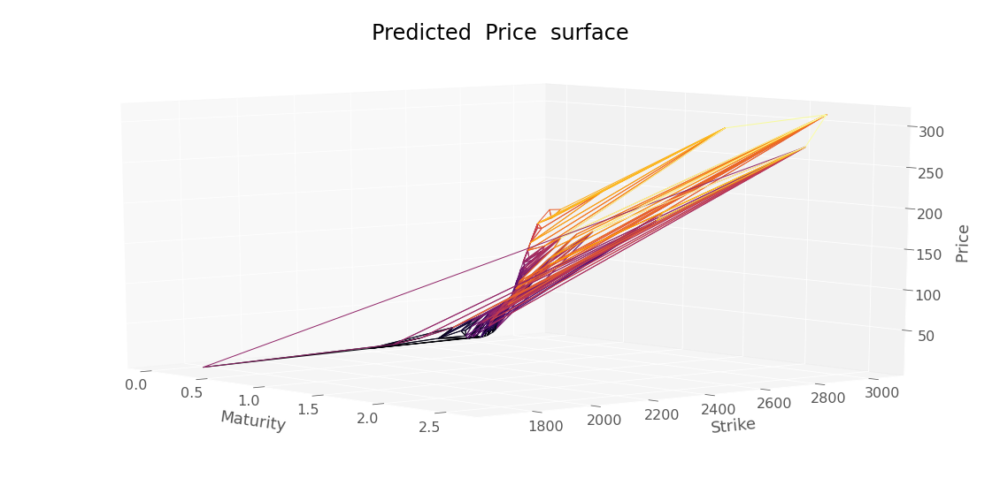

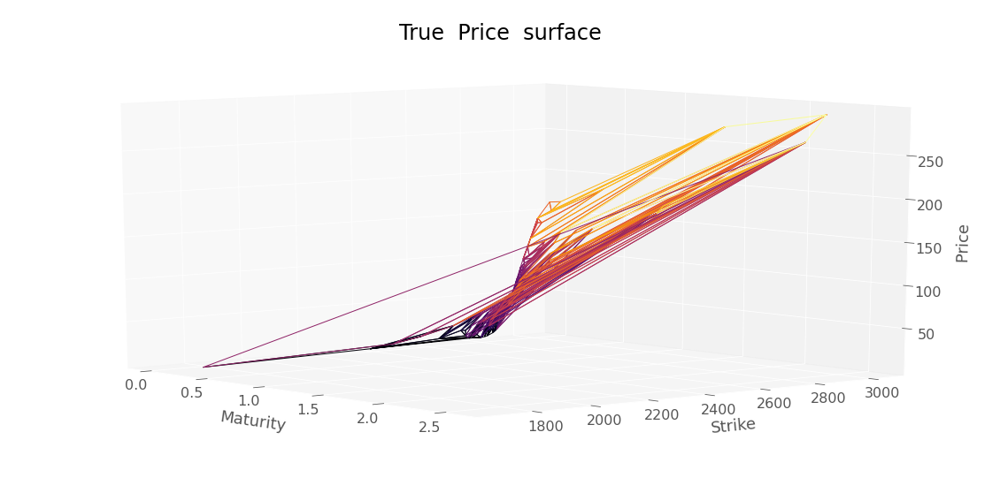

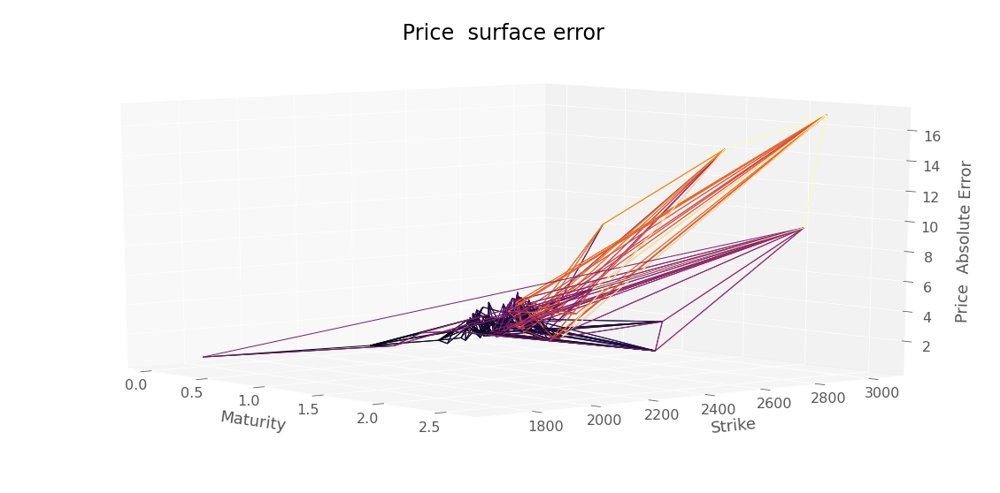

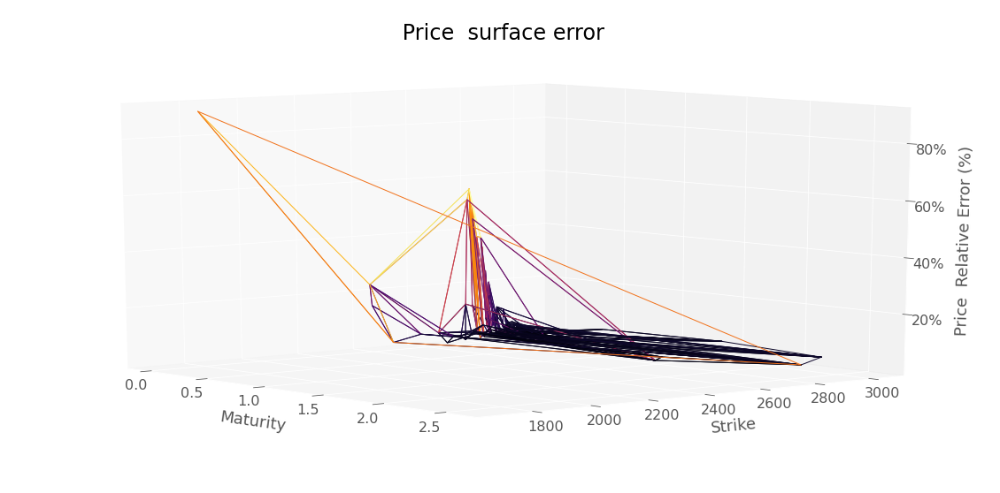

RMSE :  2.5512816400758305


In [ ]:
plotTools.predictionDiagnosis(mcResVolLocalePrix2, 
                              dataSetTest["Price"], 
                              " Price ", 
                              yMin=KMin,
                              yMax = KMax)

In [ ]:
mcResVolLocalePrix2.to_csv("mcResVolLocalePrix2.csv")

# Hyperparameter selection

In [ ]:
neuralNetwork.selectHyperparametersRandom(hyperparameters,
                                          ["lambdaLocVol","lambdaSoft","lambdaGamma"],
                                          neuralNetwork.NNArchitectureVanillaSoftGatheral,
                                          "hyperParameters",
                                          True, 
                                          100,
                                          scaledDataSet,
                                          scaler,
                                          trainedOnPrice = False,
                                          logGrid = True)

lambdaLocVol  :  0.10000000000000002
lambdaSoft  :  9.999999999999997e-06
lambdaGamma  :  1000.0000000000002
Iteration :  380 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 50, iterations: 381): -6.66
Best Penalization :  [0.0012736307, [6.741174e-09, 0.0, 9.1158345e-06]]
Iteration :  513 new learning rate :  0.0010000000000000002
Best loss (hidden nodes: 50, iterations: 514): -6.95
Best Penalization :  [0.00096182676, [2.366536e-09, 0.0, 0.0]]
Best loss (hidden nodes: 50, iterations: 1000): -7.84
Best Penalization :  [0.0003935813, [0.0, 0.0, 0.0]]
Training Time :  27.100327968597412
loss :  -7.8402228355407715
nbArbitrageViolation :  0



lambdaLocVol  :  0.01
lambdaSoft  :  9.999999999999995e-07
lambdaGamma  :  9.999999999999998
Iteration :  209 new learning rate :  0.010000000000000002
Best loss (hidden nodes: 50, iterations: 210): -6.03
Best Penalization :  [0.0023911684, [4.0400545e-09, 0.0, 2.7462302e-06]]
Iteration :  531 new learning rate :  0.0010000000000

In [ ]:
#hyperparameters["lambdaLocVol"] = 100
#hyperparameters["lambdaSoft"] = 100 
#hyperparameters["lambdaGamma"] = 10000
hyperparameters["lambdaLocVol"] = 0.01#0.01 #100
hyperparameters["lambdaSoft"] = 0.01#10#10 #100 
hyperparameters["lambdaGamma"] = 100#10 #10000

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "DupireVarCap", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["lambdaLocVol"] = 100



In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["nbUnits"] = 40



In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "nbUnits", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = False)

In [ ]:
hyperparameters["nbUnits"] = 200


In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "lambdaLocVol", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = True)

In [ ]:
hyperparameters["nbUnits"] = 40

In [ ]:
neuralNetwork.selectHyperparameters(hyperparameters, 
                                    "nbUnits", 
                                    neuralNetwork.NNArchitectureVanillaSoftGatheral, 
                                    "hyperParameters", 
                                    True, 
                                    scaledDataSet,
                                    scaler,
                                    trainedOnPrice = False,
                                    logGrid = False)

In [ ]:
hyperparameters["nbUnits"] = 200